<!-- Container with white background -->
<div style="background-color: white; padding: 20px; border-radius: 10px;">

  <!-- Name in bold and approximate LaTeX font style with the logo blue color -->
  <h1 style="font-family: 'Times New Roman', Times, serif; font-weight: bold; color: #38549c; text-align: center;">
    Jesus Villota Miranda
  </h1>

  <!-- Project name in similar style with the logo blue color in italics -->
  <h2 style="font-family: 'Times New Roman', Times, serif; color: #38549c; text-align: center; font-style: italic;">
    Predicting Market Reactions to News: An LLM-Based Approach Using Spanish Business Articles
  </h2>

  <!-- CEMFI logo centered -->
  <div style="text-align: center; margin-bottom: 40px;">
    <img src="https://www.cemfi.es/images/Logo-Azul.png" alt="CEMFI Logo" style="width:200px;">
  </div>

  <!-- Catchy message about authorship -->
  <p style="font-family: 'Times New Roman', Times, serif; color: #38549c; text-align: center; font-size: 1.2em;">
    All code and work associated with this project are solely created and authored by Jesus Villota Miranda. © 2024
  </p>

  <!-- Contact information with logos -->
  <p style="font-family: 'Times New Roman', Times, serif; color: #38549c; text-align: center; font-size: 1em;">
    Contact:
    <a href="mailto:jesus.villota@cemfi.edu.es" style="color: #38549c;">
      <img src="https://www.logolynx.com/images/logolynx/64/64319177556c729f1806922bcd3adef5.png" alt="Email Logo" style="width: 20px; vertical-align: middle;">
      jesus.villota@cemfi.edu.es
    </a> |
    <a href="https://www.linkedin.com/in/jesusvillotamiranda/" target="_blank" style="color: #38549c;">
      <img src="https://1.bp.blogspot.com/-onvhHUdW1Us/YI52e9j4eKI/AAAAAAAAE4c/6s9wzOpIDYcAo4YmTX1Qg51OlwMFmilFACLcBGAsYHQ/s1600/Logo%2BLinkedin.png" alt="LinkedIn Logo" style="width: 20px; vertical-align: middle;">
      LinkedIn
    </a>
  </p>

</div>


<h1 style="font-family: 'Times New Roman', Times, serif; font-weight: bold; color: #38549c; text-align: center;">
    kernel: Python 3.9.6
  </h1>

# **Preamble**

## Packages

In [ ]:
%reset -f

In [1]:
model = 'LLAMA'

import csv
import os
import pandas as pd
import numpy as np
import ast
from datetime import timedelta
import itertools

import warnings
warnings.filterwarnings('ignore')

import yfinance as yf
import statsmodels.api as sm
import scipy.stats

from joblib import Parallel, delayed
from tabnanny import verbose
from collections import OrderedDict

In [2]:
# Plotting packages
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.patches import Rectangle
from matplotlib.dates import DateFormatter
from matplotlib import rc
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

## Directories

In [3]:
import yaml

def load_config(config_path):
    with open(config_path, 'r') as file:
        config = yaml.safe_load(file)
    return config

def create_project_structure(base_path, directories):
    for _, directory in directories.items():
        dir_path = os.path.join(base_path, directory)
        os.makedirs(dir_path, exist_ok=True)
        print(f"Created directory: {dir_path}")

if __name__ == "__main__":
    base_path = os.path.dirname(os.getcwd())
    config_path = os.path.join(base_path, 'config.yaml')
    config = load_config(config_path)
    create_project_structure(base_path, config['directories'])

path_raw_data       = os.path.join(base_path, config['directories']['raw_data'])
path_processed_data = os.path.join(base_path, config['directories']['processed_data'])
path_output         = os.path.join(base_path, config['directories']['output_llama'])

Created directory: /Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/_Other_/Master_Thesis-Replication_Package-main/data/raw
Created directory: /Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/_Other_/Master_Thesis-Replication_Package-main/data/processed
Created directory: /Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/_Other_/Master_Thesis-Replication_Package-main/notebooks
Created directory: /Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/_Other_/Master_Thesis-Replication_Package-main/output/descriptives
Created directory: /Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/_Other_/Master_Thesis-Replication_Package-main/output/kmeans
Created directory: /Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/_Other_

## Plotting Parameters

In [4]:
TITLE_FONTSIZE  = 18
LABEL_FONTSIZE  = 20
TICK_FONTSIZE   = 18
LEGEND_FONTSIZE = 16

TITLE_PAD       = 20
LABEL_PAD       = 20

#
---
---

# **Data**

Load the articles parsed by LLaMA-3. 

$$\mathcal{B}_{L L M}:=\left\{(i, j) \mid i \in \mathcal{D} \wedge j \in \mathcal{F}_{L L M}^i\right\}$$

In [5]:
B = pd.read_csv(os.path.join(path_raw_data, "LLAMA_parsed_news.csv"))
B

,article_id,firm,tickers,shock_type,shock_magnitude,shock_direction
0,0,Cellnex,CLNX.MC,financial,minor,positive
1,1,ENCE (ENC.MC),ENC.MC,policy,minor,positive
2,1,Iberdrola (IBE.MC),IBE.MC,policy,minor,positive
3,1,Acciona (ANA.MC),ANA.MC,policy,minor,positive
4,2,Telefónica SA,TEF.MC,policy,minor,positive
...,...,...,...,...,...,...
3319,2608,Naturgy Energy Group S.A.,NTRGY.MC,financial,minor,negative
3320,2609,Naturgy,NTGY.MC,financial,minor,negative
3321,2610,Merlin Properties SOCIMI SA,MRL.MC,financial,minor,positive
3322,2611,Banco de Sabadell S.A.,SAB.MC,financial,major,negative


Load the return data: 

$$
~\mathcal R:= \left\{\{r^f_d\}_{d\in\tilde{\mathfrak{d}}}, \{r^M_d\}_{d\in\tilde{\mathfrak{d}}}, \{\{\{r^j_d\}_{d\in\tilde{\mathfrak{d}}}\}_{j\in \mathcal F^i}\}_{i\in\mathcal D}\right\}
$$

In [6]:
R = pd.read_csv(os.path.join(path_processed_data, 'R_LLAMA.csv'), index_col=0, parse_dates=True)
𝖉 = [dt.date() for dt in R.index]
R.index = 𝖉

# Read successful_tickers 
with open(os.path.join(path_processed_data, 'successful_tickers_LLAMA.txt'), 'r') as f:
    successful_tickers = f.read().splitlines()

# Read failed_tickers
with open(os.path.join(path_processed_data, 'failed_tickers_LLAMA.txt'), 'r') as f:
    failed_tickers = f.read().splitlines()

R

,rf,r_market,r_market_excess,r_CLNX.MC,r_CLNX.MC_excess,r_ENC.MC,r_ENC.MC_excess,r_IBE.MC,r_IBE.MC_excess,r_ANA.MC,...,r_CAF.MC,r_CAF.MC_excess,r_ TRE.MC,r_ TRE.MC_excess,r_ENER.MC,r_ENER.MC_excess,r_TLGO.MC,r_TLGO.MC_excess,r_ROVI.MC,r_ROVI.MC_excess
2019-10-01,-0.000022,-0.008513,-0.008491,0.007916,NaN,-0.049284,NaN,-0.012165,NaN,-0.015963,...,-0.015606,NaN,-0.011535,NaN,NaN,NaN,-0.013807,NaN,-0.018265,NaN
2019-10-02,-0.000022,-0.027679,-0.027657,-0.019110,-0.019088,-0.026522,-0.026500,-0.011677,-0.011655,0.001570,...,-0.032927,-0.032905,-0.017056,-0.017034,NaN,NaN,-0.014000,-0.013978,0.000000,0.000022
2019-10-03,-0.000022,-0.001122,-0.001100,0.006405,0.006427,-0.027245,-0.027223,-0.001074,-0.001052,-0.009404,...,-0.031526,-0.031504,-0.008219,-0.008197,NaN,NaN,-0.004057,-0.004035,-0.013953,-0.013931
2019-10-04,-0.000022,0.006695,0.006717,0.007160,0.007182,-0.019096,-0.019074,0.009462,0.009484,0.008966,...,0.026042,0.026064,0.010129,0.010151,NaN,NaN,0.017312,0.017334,0.009434,0.009456
2019-10-07,-0.000022,0.009183,0.009205,-0.001843,-0.001821,0.018819,0.018841,0.003835,0.003857,0.012023,...,0.017766,0.017788,-0.000912,-0.000890,NaN,NaN,0.025025,0.025047,-0.004673,-0.004651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-17,0.000152,0.010164,0.010012,0.028031,0.027879,-0.003240,-0.003393,0.007188,0.007035,0.002796,...,-0.007862,-0.008014,0.034543,0.034391,0.000000,-0.000152,0.020571,0.020419,-0.011635,-0.011787
2024-04-18,0.000152,0.012328,0.012176,0.003614,0.003462,-0.006502,-0.006654,0.007583,0.007430,0.008364,...,0.014263,0.014111,0.011884,0.011732,0.018519,0.018366,-0.007839,-0.007991,-0.015489,-0.015642
2024-04-19,0.000152,-0.003298,-0.003450,0.004910,0.004758,0.007199,0.007047,0.003984,0.003832,-0.011982,...,-0.007812,-0.007965,0.012864,0.012711,0.012987,0.012835,-0.006772,-0.006924,-0.000629,-0.000781
2024-04-22,0.000152,0.014977,0.014825,0.012052,0.011900,0.040936,0.040783,0.009700,0.009548,0.000000,...,0.007874,0.007722,0.001104,0.000952,-0.005128,-0.005280,0.002273,0.002120,0.000630,0.000477


In [7]:
# Load the D dataset to assign date_affect to B
D = pd.read_csv(os.path.join(path_processed_data, 'D_embeddings.csv'), index_col=0)
# only keep 'articles' and 'date_affect' columns
D = D[['articles', 'date_affect']]

D

,articles,date_affect
0,Permanencia de los Benetton en accionariado Ce...,2020-06-24
1,Retomar subastas renovables en España sería bu...,2020-06-24
2,Presidente Telefónica prevé consolidación en s...,2020-06-24
3,Amadeus saldrá reforzado de esta crisis -Sabad...,2020-06-24
4,Fondo Polygon solicita a CNMV que analice y al...,2020-06-24
...,...,...
2608,Naturgy afirma que no ha considerado revisar r...,2021-09-30
2609,No hay peligro de recorte de dividendo en Natu...,2021-09-30
2610,Merlin Properties pone a la venta cartera de s...,2021-09-30
2611,Banco Sabadell rebaja de 1.936 a 1.730 las per...,2021-09-30


In [8]:
B = B.merge(D, left_on='article_id', right_index=True, how='left')
# ensuring the right format for date_affect
if not pd.api.types.is_datetime64_any_dtype(B['date_affect']):
    B['date_affect'] = pd.to_datetime(B['date_affect']).dt.date
del D
B

,article_id,firm,tickers,shock_type,shock_magnitude,shock_direction,articles,date_affect
0,0,Cellnex,CLNX.MC,financial,minor,positive,Permanencia de los Benetton en accionariado Ce...,2020-06-24
1,1,ENCE (ENC.MC),ENC.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24
2,1,Iberdrola (IBE.MC),IBE.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24
3,1,Acciona (ANA.MC),ANA.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24
4,2,Telefónica SA,TEF.MC,policy,minor,positive,Presidente Telefónica prevé consolidación en s...,2020-06-24
...,...,...,...,...,...,...,...,...
3319,2608,Naturgy Energy Group S.A.,NTRGY.MC,financial,minor,negative,Naturgy afirma que no ha considerado revisar r...,2021-09-30
3320,2609,Naturgy,NTGY.MC,financial,minor,negative,No hay peligro de recorte de dividendo en Natu...,2021-09-30
3321,2610,Merlin Properties SOCIMI SA,MRL.MC,financial,minor,positive,Merlin Properties pone a la venta cartera de s...,2021-09-30
3322,2611,Banco de Sabadell S.A.,SAB.MC,financial,major,negative,Banco Sabadell rebaja de 1.936 a 1.730 las per...,2021-09-30


#
---
---

# **Clustering**

We can define the set $\mathcal{B}_{L L M}:=\left\{(i, j) \mid i \in \mathcal{D} \wedge j \in \mathcal{F}_{L L M}^i\right\}$ and ask the LLM to classify the event or shock described in the news article for each firm $j \in \mathcal{F}_{L L M}^i$. This classification involves assigning each pair $(i, j) \in \mathcal{B}_{L L M}$ with a choice from the following sets:
$$
\begin{array}{ll}
\text { "shock type" } & \left.\mathcal{S}_T=\text { \{ demand, supply, financial, technological, policy }\right\} \\
\text { "shock magnitude" } & \left.\mathcal{S}_M=\text {\{ minor, major }\right\} \\
\text { "shock direction" } & \left.\mathcal{S}_D=\text { \{ positive, negative }\right\}
\end{array}
$$

The clustering of news articles follows naturally by taking the Cartesian product of these three sets: $\mathcal{G}_{L L M}=\mathcal{S}_T \times \mathcal{S}_M \times \mathcal{S}_D$, and the total number of cluster is now $k_{L L M}=\left|\mathcal{G}_{L L M}\right|=20$. Consequently, a news article to which the LLM assigns $s_T \in \mathcal{S}_T, s_M \in \mathcal{S}_M, s_D \in \mathcal{S}_D$ will belong to cluster $\left(s_T, s_M, s_D\right) \in \mathcal{G}_{L L M}$. Formally, the set of all possible clusters is defined as:
$$
\mathcal{G}_{L L M}=\left\{\left(s_T, s_M, s_D\right) \mid s_T \in \mathcal{S}_T, s_M \in \mathcal{S}_M, s_D \in \mathcal{S}_D\right\}
$$

Then, we can map $\mathcal{G}_{L L M} \rightarrow\left\{k \in \mathbb{N}_0 \mid 0 \leq k \leq 19\right\}$ to obtain a numerical representation of the clusters. 

In [9]:
# Define the sets
shock_type      = ['demand', 'supply', 'financial', 'technology', 'policy']
shock_magnitude = ['minor', 'major']
shock_direction = ['positive', 'negative']

# Create the Cartesian product of the sets
clusters = list(itertools.product(shock_type, shock_magnitude, shock_direction))

# Map each combination to a unique number
cluster_map = {cluster: idx for idx, cluster in enumerate(clusters)}

# Function to get cluster number for a row
def get_cluster(row):
    return cluster_map[(row['shock_type'], row['shock_magnitude'], row['shock_direction'])]

# Apply the function to assign clusters
B['cluster'] = B.apply(get_cluster, axis=1)
B

,article_id,firm,tickers,shock_type,shock_magnitude,shock_direction,articles,date_affect,cluster
0,0,Cellnex,CLNX.MC,financial,minor,positive,Permanencia de los Benetton en accionariado Ce...,2020-06-24,8
1,1,ENCE (ENC.MC),ENC.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16
2,1,Iberdrola (IBE.MC),IBE.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16
3,1,Acciona (ANA.MC),ANA.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16
4,2,Telefónica SA,TEF.MC,policy,minor,positive,Presidente Telefónica prevé consolidación en s...,2020-06-24,16
...,...,...,...,...,...,...,...,...,...
3319,2608,Naturgy Energy Group S.A.,NTRGY.MC,financial,minor,negative,Naturgy afirma que no ha considerado revisar r...,2021-09-30,9
3320,2609,Naturgy,NTGY.MC,financial,minor,negative,No hay peligro de recorte de dividendo en Natu...,2021-09-30,9
3321,2610,Merlin Properties SOCIMI SA,MRL.MC,financial,minor,positive,Merlin Properties pone a la venta cartera de s...,2021-09-30,8
3322,2611,Banco de Sabadell S.A.,SAB.MC,financial,major,negative,Banco Sabadell rebaja de 1.936 a 1.730 las per...,2021-09-30,11


#
---
---

# **Sample of articles from each cluster**

In [10]:
# Set the sample size
sample_size = 20

# Create the dictionary to store sampled articles
sampled_articles_dict = {}

# Group by cluster and sample 20 articles per cluster, focusing on the wording of the articles
for cluster, group in B.groupby('cluster'):
    sampled_articles_dict[cluster] = group['articles'].sample(min(len(group), sample_size)).tolist()

# Print the dictionary with sampled articles, separating each article with a delimiter
for cluster, articles in sampled_articles_dict.items():
    if cluster == 19:
        print(f"Cluster {cluster}:")
        for article in articles:
            print(article)
            print('_' * 50)  # Delimiter to separate articles
        print("\n")


Cluster 19:
Mayor impacto por cambios sector eléctrico en España es reputacional.  Renta 4 estima que el mayor impacto de los cambios anunciados el martes por el Gobierno español para abaratar la factura de la luz de los consumidores, que incluye una reducción temporal de los ingresos extraordinarios de las plantas no emisoras por los altos precios del gas por unos EUR2.600 millones, "es a nivel reputacional para el país y el sector, ya que no se ha terminado de especificar los detalles de aplicación de esta nueva normativa y todo este proceso genera un elevado grado de incertidumbre de cara a los impactos en las compañías". En una nota de análisis, el banco señala que la mayoría de las iniciativas "eran algo ya esperado, aunque con un impacto peor al previamente estimado", agrega. El efecto extraordinario de los EUR2.600 millones "es difícil de cuantificar en cuanto a la cuenta de resultados y la generación de caja (y por ende en la política de dividendos), ya que no se especifica el 

#
---
---

# **Data Split**

In [11]:
split1 = 0.8
split2 = 0.6

split_threshold1 = int(len(B['article_id'].unique()) * split1)
split_threshold2 = int(len(B['article_id'].unique()) * split1 * split2)

# if article_id > split_threshold, then "Split" column is "Test", if split_threshold2 <= article_id <= split_threshold, then "Split" column is "Validation", else "Train"
B['split'] = np.where(B['article_id'] > split_threshold1, 'Test', np.where(B['article_id'] > split_threshold2, 'Validation', 'Train'))
B

,article_id,firm,tickers,shock_type,shock_magnitude,shock_direction,articles,date_affect,cluster,split
0,0,Cellnex,CLNX.MC,financial,minor,positive,Permanencia de los Benetton en accionariado Ce...,2020-06-24,8,Train
1,1,ENCE (ENC.MC),ENC.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train
2,1,Iberdrola (IBE.MC),IBE.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train
3,1,Acciona (ANA.MC),ANA.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train
4,2,Telefónica SA,TEF.MC,policy,minor,positive,Presidente Telefónica prevé consolidación en s...,2020-06-24,16,Train
...,...,...,...,...,...,...,...,...,...,...
3319,2608,Naturgy Energy Group S.A.,NTRGY.MC,financial,minor,negative,Naturgy afirma que no ha considerado revisar r...,2021-09-30,9,Test
3320,2609,Naturgy,NTGY.MC,financial,minor,negative,No hay peligro de recorte de dividendo en Natu...,2021-09-30,9,Test
3321,2610,Merlin Properties SOCIMI SA,MRL.MC,financial,minor,positive,Merlin Properties pone a la venta cartera de s...,2021-09-30,8,Test
3322,2611,Banco de Sabadell S.A.,SAB.MC,financial,major,negative,Banco Sabadell rebaja de 1.936 a 1.730 las per...,2021-09-30,11,Test


#
---
---

# **Distribution of Articles through Clusters**

In [12]:
cluster_counts = B['cluster'].value_counts().sort_index()
print(cluster_counts)

cluster
0      371
1      121
2       67
3       60
4      130
5       92
6       54
7       76
8     1087
9      354
10     270
11     235
12      49
13       1
14      25
16     198
17      52
18      57
19      25
Name: count, dtype: int64


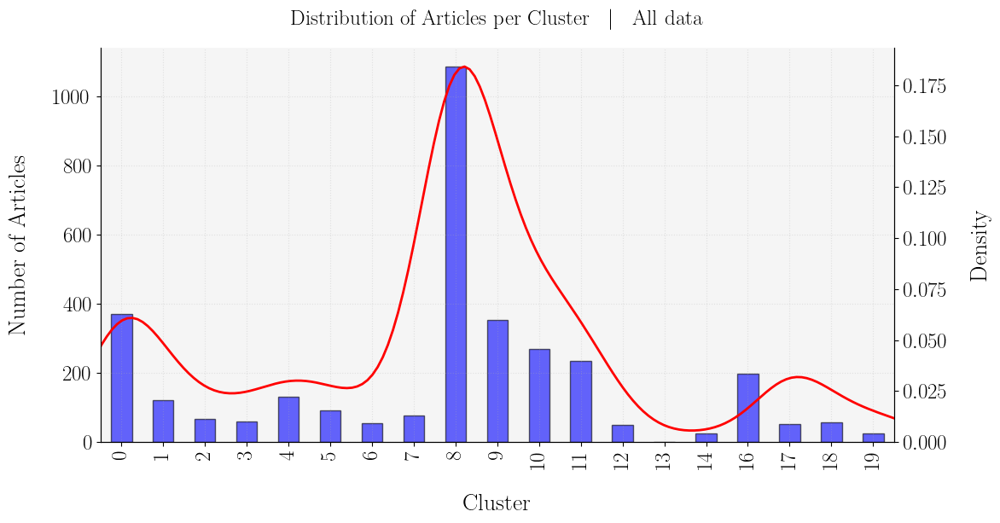

In [13]:
save_this_plot  = True
show_title      = True
plot_density    = True

#===============================================================================================================

# Calculate the distribution of articles per cluster
cluster_counts = B['cluster'].value_counts().sort_index()

# Create a bar plot for the counts
fig, ax1 = plt.subplots(figsize=(12, 6))
cluster_counts.plot(kind='bar', ax=ax1, alpha=0.6, color='blue', edgecolor='black')
ax1.set_xlabel('Cluster', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
ax1.set_ylabel('Number of Articles', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
ax1.set_title('Distribution of Articles per Cluster $~\mid~$ All data', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
ax1.tick_params(axis='both', which='major', labelsize=TICK_FONTSIZE)
ax1.grid(True, alpha=0.3, linestyle=':')
ax1.set_facecolor('#f5f5f5')

ax1.spines['top'].set_visible(False)


ax1.spines['right'].set_visible(False) if not plot_density else None

if plot_density: 
    # Create a secondary y-axis for the density plot
    ax2 = ax1.twinx()
    sns.kdeplot(B['cluster'], ax=ax2, color='red', linewidth=2)
    ax2.set_ylabel('Density', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
    ax2.tick_params(axis='both', which='major', labelsize=TICK_FONTSIZE)
    ax1.set_facecolor('#f5f5f5')
    ax2.spines['top'].set_visible(False)

# Save the plot if requested
plt.savefig(os.path.join(path_output, f'{model}_Cluster_Distribution.pdf'), bbox_inches='tight') if save_this_plot else None
plt.show()


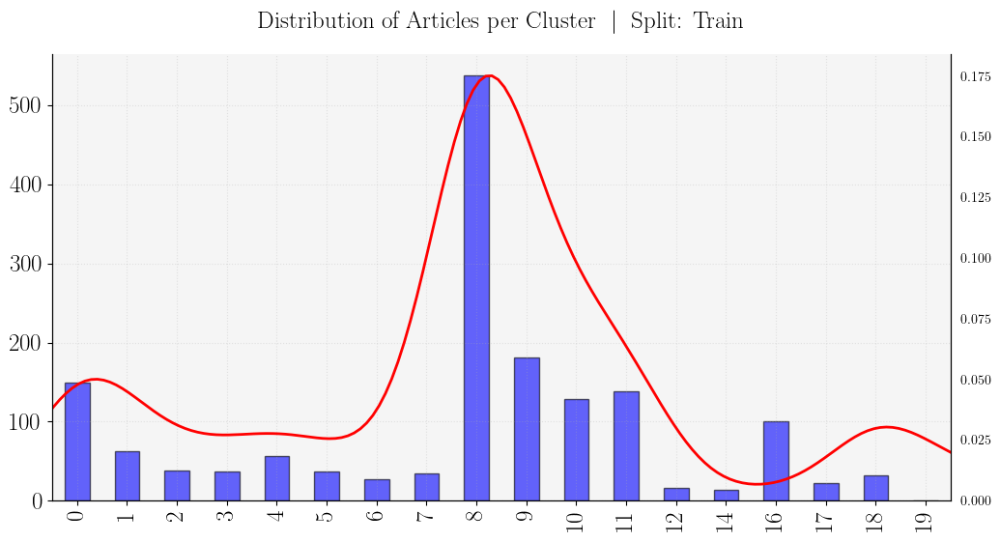

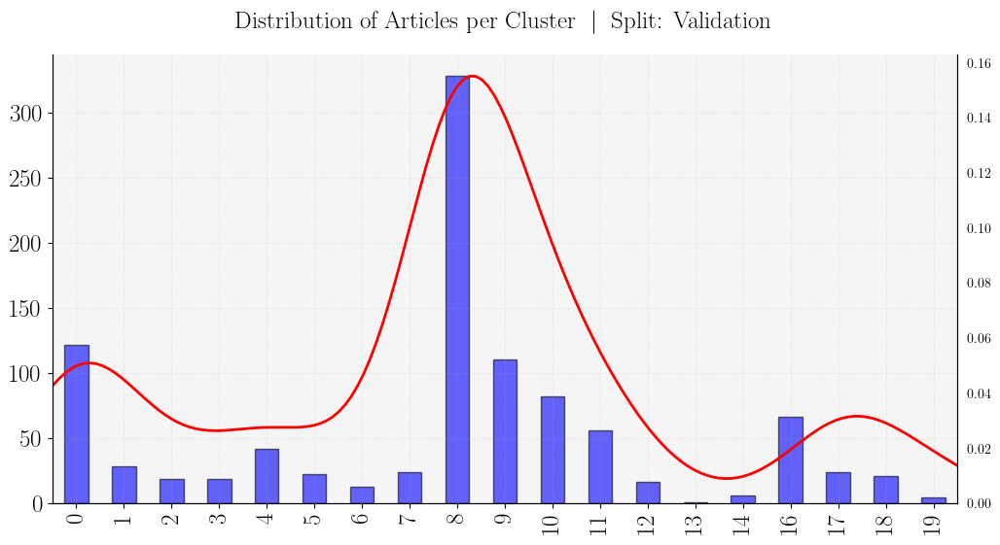

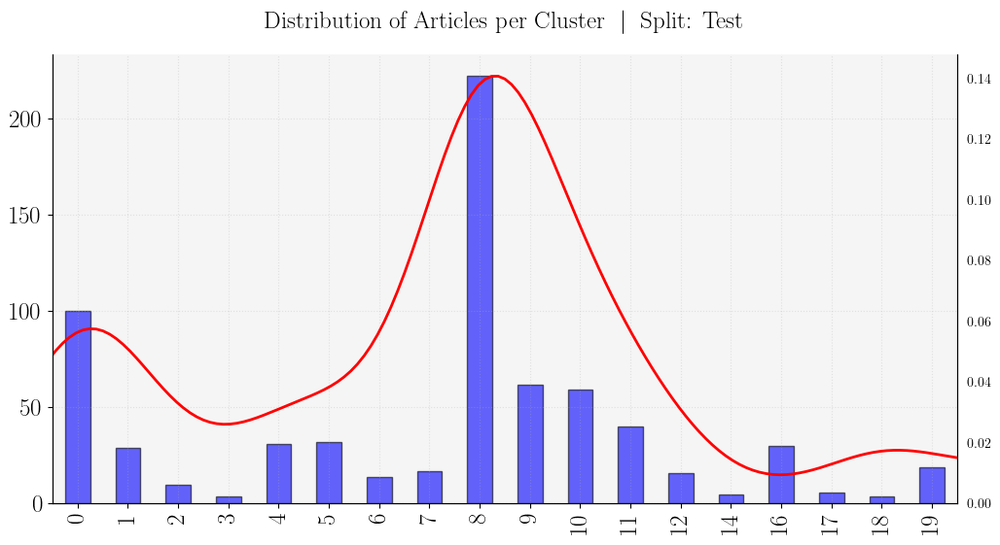

In [14]:
save_this_plot  = True
show_title      = True
plot_density    = True
#===============================================================================================================

for split in B['split'].unique():
    # Filter the data for the current split
    split_data = B[B['split'] == split]
    
    # Calculate the distribution of articles per cluster
    cluster_counts = split_data['cluster'].value_counts().sort_index()
    
    # Create a bar plot for the counts
    fig, ax1 = plt.subplots(figsize=(12, 6))
    cluster_counts.plot(kind='bar', ax=ax1, alpha=0.6, color='blue', edgecolor='black')
    ax1.set_xlabel('', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)  # Set empty x-label
    ax1.set_ylabel('', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)  # Set empty y-label
    ax1.set_title(f'Distribution of Articles per Cluster $~|~$ Split: {split}', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
    
    ax1.tick_params(axis='y', which='major', labelsize=TICK_FONTSIZE)  # Set y-ticks size for the left axis
    ax1.tick_params(axis='x', which='major', labelsize=TICK_FONTSIZE)  # Set x-ticks size
    ax1.grid(True, alpha=0.3, linestyle=':')
    ax1.set_facecolor('#f5f5f5')
    ax1.spines['top'].set_visible(False)

    if plot_density: 
        # Create a secondary y-axis for the density plot
        ax2 = ax1.twinx()
        sns.kdeplot(split_data['cluster'], ax=ax2, color='red', linewidth=2)
        ax2.set_ylabel('', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)  # Set empty y-label for density plot
        ax2.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)  # Remove y-ticks for the right axis
        ax2.tick_params(axis='x', which='major', labelsize=TICK_FONTSIZE)  # Ensure x-ticks size matches the left axis
        ax1.set_facecolor('#f5f5f5')
        ax2.spines['top'].set_visible(False)

    # Save the plot if requested
    if save_this_plot:
        plt.savefig(os.path.join(path_output, f'{model}_Cluster_Distribution_{split}.pdf'), bbox_inches='tight')
    
    plt.show()

#
---
---

# **Trading Strategy Data**

<span style="color:orange"> 1) Fit the Market Model </span>
$$r_d^j=\alpha^{(i, j)}+\beta^{(i, j)} r_d^M+\epsilon_d^{(i, j)} \quad \forall d \in \mathcal{M}^i$$

*where the market model window is defined as $\mathcal{M}^i:=\{d \in \tilde{\mathfrak{d}} \mid \mathbb{D}_{\tilde{\mathfrak{d}}}(\mathbb{I}_{\tilde{\mathfrak{d}}}(\tilde{d}_0^i)-w_b-w_m) \leq d \leq \mathbb{D}_{\tilde{\mathfrak{d}}}(\mathbb{I}_{\tilde{\mathfrak{d}}}(\tilde{d}_0^i)-w_b)\}$, with a buffer of $w_b=10$ trading days before the effective treatment date, and a market model window length of $w_m=100$ trading days.*


<span style="color:orange"> 2) Compute the returns of the Hedged Portfolio (Abnormal Returns, `AR`) over the $L$ trading days </span>

$$A R_d^{(i, j)} := r_d^j-\beta^{(i, j)} r_d^M=\alpha^{(i, j)}+\epsilon_d^{(i, j)}$$



<span style="color:orange"> 3) Compute the Cumulative Abnormal Return (`CAR`) over the $L$ trading days  </span>

$$
{C A R}^{(i, j)}=\prod_{d\in\mathcal{M}^i}\left(1+A R_d^{(i, j)}\right) - 1
$$

<span style="color:orange"> 4) Compute the Average Daily Return (`μ`), Standard Deviation (`σ`), and Sharpe Ratio (`SR`) over the $L$ trading days  </span>
\begin{array}{ll}
\mu_L^{(i, j)} 
&=
\frac{1}{L+1} \sum_{d\in\mathcal{M}^i} \ln \left(1+A R_d^{(i, j)}\right)
\\[1.5em]
\sigma_L^{(i, j)}
&=
\sqrt{\frac{1}{L} \sum_{d\in\mathcal{M}^i}\left[\ln \left(1+A R_d^{(i, j)}\right)-\mu_L^{(i, j)}\right]^2}
\\[1.5em]
S R_L^{(i, j)}
&=
\mu_L^{(i, j)} / \sigma_L^{(i, j)}
\end{array}

In [15]:
def TradingStrategy_Data(ticker, date_affect, R=R, successful_tickers=successful_tickers, L_max=260, MarketModel_window=100, MarketModel_buffer=10):
    """
    Calculate the Cumulative Abnormal Return (CAR) for a given stock ticker and event date.

    Parameters:
    ticker (str): The stock ticker symbol.
    date_affect (datetime.date): The date of the event affecting the stock.
    R (pd.DataFrame): DataFrame containing the returns data.
    successful_tickers (list): List of successful tickers.
    L_max (int, optional): The holding period. Default is 260.
    MarketModel_window (int, optional): The window size for the market model estimation. Default is 100.
    MarketModel_buffer (int, optional): The buffer period before the event date for the market model. Default is 10.

    Returns:
    tuple: The Cumulative Abnormal Return (CAR), average daily return (μ), annualized return, standard deviation (σ), Sharpe Ratio (SR), or (np.nan, np.nan, np.nan, np.nan, np.nan) if an error occurs.
    """
    if ticker not in successful_tickers:
        return np.nan, np.nan, np.nan, np.nan, np.nan
    try:
        # Ensure date_affect is in the index
        if date_affect not in R.index:
            raise ValueError("date_affect not in DataFrame index")

        # We work with indices to ensure trading days
        idx_date_affect        = R.index.get_loc(date_affect)
        idx_Start_MarketModel  = idx_date_affect - MarketModel_window - MarketModel_buffer
        idx_End_MarketModel    = idx_date_affect - MarketModel_buffer 

        # Ensure indices are within bounds
        if idx_Start_MarketModel < 0 or idx_End_MarketModel > len(R):
            raise IndexError("Market model window indices out of bounds")

        # 1) Fit the Market Model
        y = R.iloc[idx_Start_MarketModel:idx_End_MarketModel + 1, R.columns.get_loc(f'r_{ticker}_excess')]
        X = sm.add_constant(R.iloc[idx_Start_MarketModel:idx_End_MarketModel + 1, R.columns.get_loc('r_market_excess')])
        model = sm.OLS(y, X, missing='drop').fit()

        # 2) Compute the returns of the Hedged Portfolio over the L trading days: r_t^i - beta r_t^M = alpha + epsilon_t =: AR
        alpha = model.params['const']
        epsilon_t = R[f'r_{ticker}_excess'] - model.predict(sm.add_constant(R['r_market_excess']))  # Computes the time series of residuals for all dates: [In-Sample for the Market Model Window] & [Out-of-Sample for the Rest]
        AR_vector = alpha + epsilon_t

        save = []

        for L in range(0, L_max+1):

            # Abnormal Returns at day date_affect + L
            AR = AR_vector.iloc[idx_date_affect + L]  # Abnormal Return

            # 3) Compute the Cumulative Abnormal Return (CAR) over the L trading days 
            CAR = (1 + AR_vector.iloc[idx_date_affect : idx_date_affect + L + 1]).prod() - 1  # Cumulative Abnormal Return : it is the accumulation of the daily abnormal returns over the L trading days
            
            # 4) Compute the Average Daily Return (μ), Standard Deviation (σ), and Sharpe Ratio (SR) over the L trading days 
            μ, σ, SR = np.nan, np.nan, np.nan
            if L > 0:
                AR_window = AR_vector.iloc[idx_date_affect : idx_date_affect + L + 1]
                μ   = (1 / (L + 1)) * np.sum(np.log(1 + AR_window))                 # Average daily return
                σ   = np.sqrt((1 / L) * np.sum((np.log(1 + AR_window) - μ) ** 2))  # Standard deviation of the residuals
                SR  = (μ / σ) * np.sqrt(252) if σ != 0 else np.nan         # Sharpe Ratio

            save.append((AR, CAR, μ, σ, SR))

        # Convert the list of tuples to a DataFrame
        TS_data = pd.DataFrame(save, columns=['AR', 'CAR', 'μ', 'σ', 'SR'])

        return TS_data

    except Exception as e:
        print(f'Error for {ticker} on {date_affect}: {e}')
        return None
        # return df

- The code below runs the procedure using **parallelization**


- Some errors will appear as there are some tickers for which the price data is incomplete or missing (delisted tickers)
    - **Ignore** these type of errors: "*Error for [TICKER] on [DATE]: zero-size array to reduction operation maximum which has no identity*"

- Running this codes takes $\approx 25$ seconds

In [16]:
def process_row(row_idx, row):
    ticker      = row['tickers']
    date_affect = row['date_affect']
    try:
        TS_data = TradingStrategy_Data(ticker, date_affect)
        return row_idx, TS_data
    except Exception as e:
        print(f'Error for {ticker} on {date_affect}: {e}')
        return row_idx, None

# Use joblib to parallelize the computation
results = Parallel(n_jobs=-1)(delayed(process_row)(row_idx, row) for row_idx, row in B.iterrows())

# Save the results in the dictionary
TS_dict = {row_idx: TS_data for row_idx, TS_data in results}

Error for SOL.MC on 2020-10-22: zero-size array to reduction operation maximum which has no identity
Error for SOL.MC on 2020-11-04: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-04-16: zero-size array to reduction operation maximum which has no identity
Error for LDA.MC on 2021-04-29: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-06-18: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-06-21: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-06-30: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-07-01: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-07-01: zero-size array to reduction operation maximum which has no identity
Error for ANE.MC on 2021-07-07: zero-size array to reduction operation maximum which has no

#
---
---

# **Average CARs across clusters for each split**

In [17]:
CAR_split_cluster = {} # Dictionary to store the cumulative abnormal returns (CAR) for each split and cluster

for row_idx, row in B.iterrows():
    TS_data = TS_dict[row_idx]
    if row_idx in TS_dict and TS_data is not None and isinstance(TS_data, pd.DataFrame):
        split    = row['split']         # Split of the row
        cluster  = row['cluster']       # Cluster of the row
        CAR      = TS_data['CAR'] + 1   # Vector of Cumulative Abnormal Returns (CAR) 

        # Create dictionary keys if they don't exist
        if (split, cluster) not in CAR_split_cluster:
            CAR_split_cluster[(split, cluster)] = {'CAR_sum': 0, 'count': 0}

        # Accumulate CAR values and count
        CAR_split_cluster[(split, cluster)]['CAR_sum'] += CAR  # Accumulate the CAR values
        CAR_split_cluster[(split, cluster)]['count']   += 1    # Increment the count

CAR_split_cluster = OrderedDict(sorted(CAR_split_cluster.items(), key=lambda x: x[0][1]))       # Sort the dictionary by cluster number (ensures that the clusters are in order, it looks better this way to have an ordered legend when plotting)

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*

CAR_average = {} # Dictionary to store the average cumulative abnormal returns (CAR) for each split and cluster

for (split, cluster), values in CAR_split_cluster.items():
    if values['count'] > 0:
        CAR_average[(split, cluster)] = values['CAR_sum'] / values['count']     # Compute the average CAR
    else:
        CAR_average[(split, cluster)] = float('nan')                            # or 0 if you prefer

In [18]:
# Print the average SR for each cluster and split
for key, avg_CAR in CAR_average.items():
    print(f"Split: {key[0]}, Cluster: {key[1]}, Average CAR: {avg_CAR}")

Split: Train, Cluster: 0, Average CAR: 0      1.009795
1      1.009177
2      1.010922
3      1.009603
4      1.011590
         ...   
256    0.977308
257    0.977658
258    0.976887
259    0.976335
260    0.975795
Name: CAR, Length: 261, dtype: float64
Split: Validation, Cluster: 0, Average CAR: 0      1.000275
1      0.999883
2      1.001664
3      0.998728
4      0.996315
         ...   
256    1.056563
257    1.058629
258    1.063283
259    1.063152
260    1.066442
Name: CAR, Length: 261, dtype: float64
Split: Test, Cluster: 0, Average CAR: 0      1.007012
1      1.008591
2      1.009455
3      1.010394
4      1.010262
         ...   
256    1.075784
257    1.079914
258    1.080953
259    1.080271
260    1.076404
Name: CAR, Length: 261, dtype: float64
Split: Train, Cluster: 1, Average CAR: 0      0.989994
1      0.989418
2      0.989842
3      0.993946
4      0.987368
         ...   
256    1.004390
257    1.005106
258    1.004445
259    1.002703
260    1.004199
Name: CAR, Length: 

#### Plot the time series of average CARs for each cluster (in separate plots for each split)

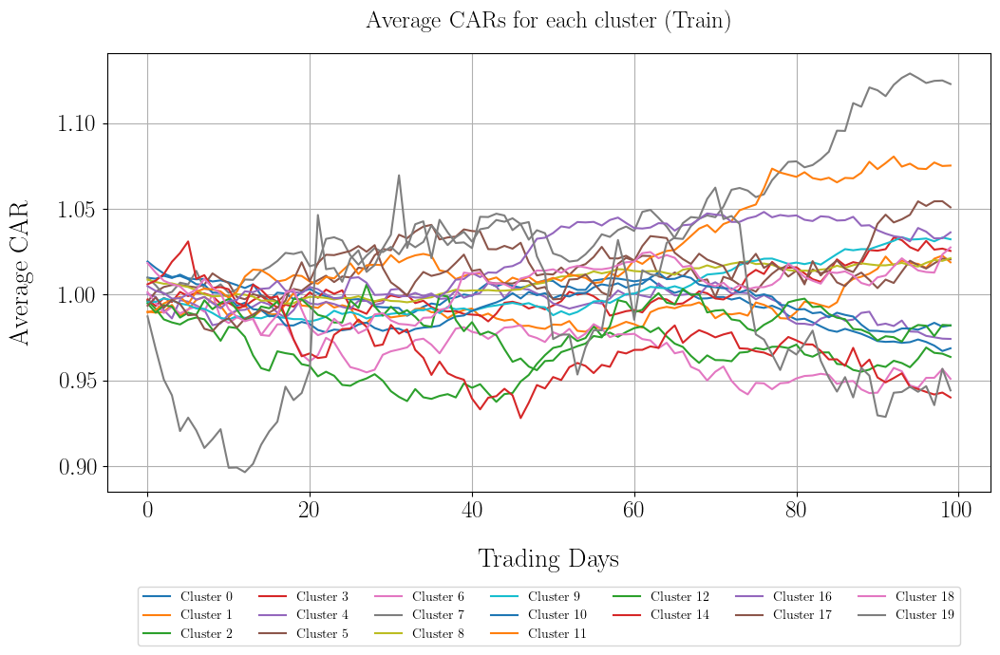

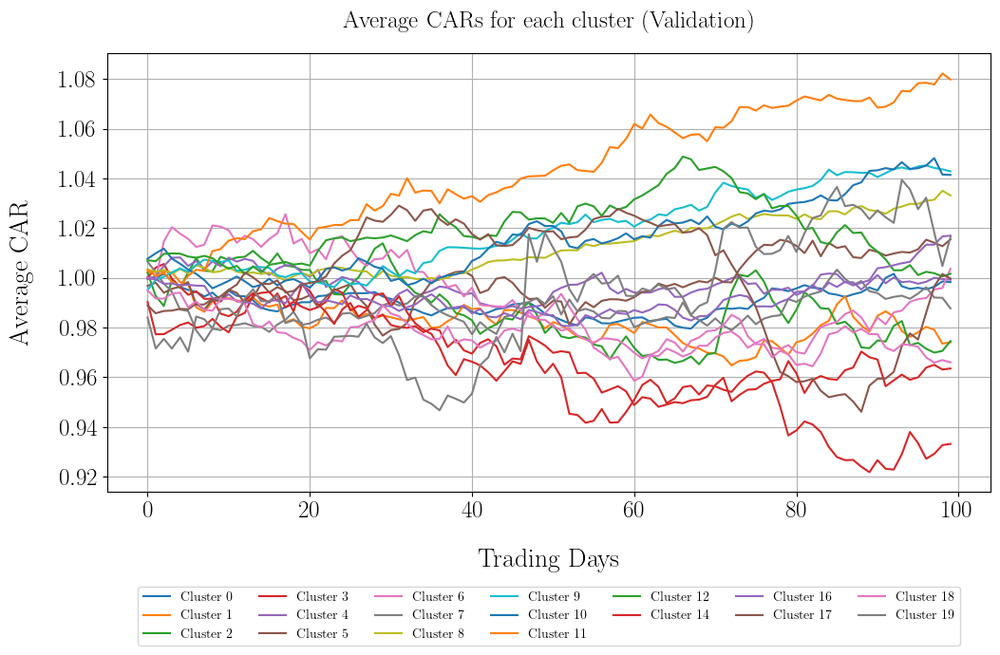

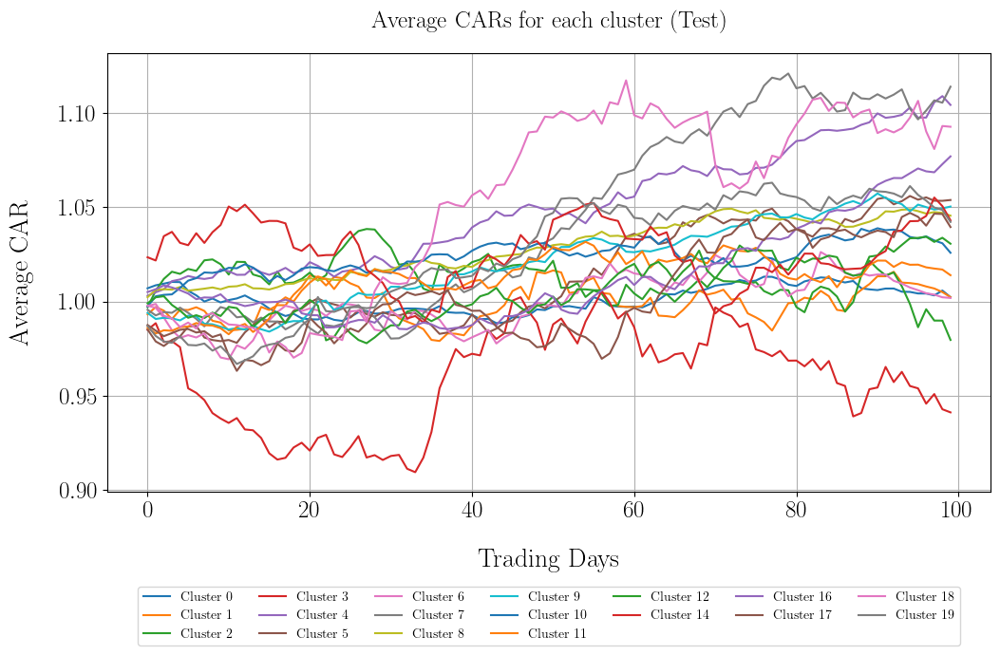

In [19]:
save_this_plot  = True
show_title      = True
#===============================================================================================================
for split_plot in B['split'].unique():
    fig, ax = plt.subplots(figsize=(12, 6))
    for (split,cluster), avg_CAR in CAR_average.items():
        if len(avg_CAR) > 0 and split == split_plot:
            avg_CAR_subset = avg_CAR[:100]
            ax.plot(avg_CAR_subset, label=f'Cluster {cluster}')
    ax.set_title(f'Average CARs for each cluster ({split_plot})', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
    ax.set_xlabel('Trading Days', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
    ax.set_ylabel('Average CAR', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
    plt.xticks(fontsize=TICK_FONTSIZE)
    plt.yticks(fontsize=TICK_FONTSIZE)
    ax.grid(True)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=7)
    plt.savefig(os.path.join(path_output, f"{model}_CARs_by_cluster_[{split_plot}].pdf"), bbox_inches='tight') if save_this_plot else None
    plt.show()
#===============================================================================================================

#
---
---

# **Hyperparameters**

$$\begin{array}{ll}
L &= 4 \\
\theta &= \lfloor 0.5 \cdot k \rfloor = 9
\end{array}$$

Note that $k=19$ in the train and validation samples due to the fact that there is one cluster for which there are no assignments

In [20]:
#============================== HYPERPARAMETERS ==============================#
L = 4                      # Holding period of the positions
k_opt = len(B['cluster'].unique()) 
prop_of_k = 0.5
θ = int(prop_of_k*k_opt)    # Number of Traded clusters
#=============================================================================#
print(f"-  Holding Period: {L}")
print(f"-  Number of Traded Clusters: {θ}")

-  Holding Period: 4
-  Number of Traded Clusters: 9


#
---
---

# **Average Sharpe Ratio across clusters for each split**

$$
\overline{S R}_g =\frac{1}{\left|\mathcal{B}_g \right|} \sum_{(i, j) \in \mathcal{B}_g} S R_L^{(i, j)}
$$
where: $\mathcal{B}_g:= \{(i, j) \mid (i, j) \in \mathcal{B} \wedge i \in \mathcal{D}_g\}$.

In [21]:
SR_split_cluster_dict = {}      # Initialize dictionary to store sum of SR and count of observations for each cluster and split

for idx_row, row in B.iterrows():
    TS_data = TS_dict[idx_row]
    if TS_data is not None and isinstance(TS_data, pd.DataFrame) and len(TS_data) > L:
        split   = row['split']
        cluster = row['cluster']
        SR_L    = TS_data['SR'][L]

        # Create dictionary keys if they don't exist
        if (split, cluster) not in SR_split_cluster_dict:
            SR_split_cluster_dict[(split, cluster)] = {'SR_sum': 0, 'count': 0}

        # Accumulate SR values and count
        SR_split_cluster_dict[(split, cluster)]['SR_sum'] += SR_L # Accumulate the SR values
        SR_split_cluster_dict[(split, cluster)]['count']  += 1    # Increment the count


SR_split_cluster_dict = OrderedDict(sorted(SR_split_cluster_dict.items(), key=lambda x: x[0][1]))       # Sort the dictionary by cluster number (ensures that the clusters are in order, it looks better this way to have an ordered legend when plotting)

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=

SR_Average_dict = {}        # Initialize dictionary to store average SR for each cluster and split

for (split, cluster), values in SR_split_cluster_dict.items():
    if values['count'] > 0:
        SR_Average_dict[(split, cluster)] = values['SR_sum'] / values['count']  # Compute the average SR
    else:
        SR_Average_dict[(split, cluster)] = float('nan')  # or 0 if you prefer

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=


print(f"{'Split':<20} {'Cluster':<10} {'Average SR':<10}")
print('-' * 40)

previous_cluster = None # Initialize a variable to keep track of the previous cluster

for idx, (key, avg_sr) in enumerate(SR_Average_dict.items(), start=1):
    current_cluster = key[1]
    if previous_cluster is not None and current_cluster != previous_cluster:
        print('-' * 40)
    print(f"{key[0]:<20} {key[1]:<10} {avg_sr:<10.6f}")
    previous_cluster = current_cluster
    
# # del SR_split_cluster_dict, idx_row, row, TS_data, split, cluster, SR_L, values, key, avg_sr

Split                Cluster    Average SR
----------------------------------------
Train                0          1.170579  
Validation           0          -0.400922 
Test                 0          2.422136  
----------------------------------------
Train                1          -1.875460 
Validation           1          -0.153740 
Test                 1          -1.513348 
----------------------------------------
Train                2          -2.539345 
Validation           2          -2.974519 
Test                 2          1.807365  
----------------------------------------
Train                3          0.067061  
Validation           3          0.070939  
Test                 3          -5.410302 
----------------------------------------
Train                4          -0.696740 
Validation           4          1.667503  
Test                 4          4.706859  
----------------------------------------
Train                5          0.244818  
Validation           5 

### Ranking of average Sharpe Ratios

 $$\mathfrak{R}_g^{split}=\sum_{h \in \mathcal{G}} \mathbf{1}\left(\overline{S R}_h^{split} \geq \overline{S R}_g^{split}\right)$$

In [22]:
SR_split_dict = {} # Group the average SRs by splits

for (split, cluster), avg_sr in SR_Average_dict.items():
    if split not in SR_split_dict:
        SR_split_dict[split] = []
    SR_split_dict[split].append((cluster, avg_sr))

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=

SR_Ranking_dict = {}    # Sort and rank the SRs within each split

for split, sr_list in SR_split_dict.items():
    SR_Ranking_dict[split] = sorted(sr_list, key=lambda x: x[1], reverse=True)

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=

print("Ranked average SRs for each split:")

for split, ranked_sr in SR_Ranking_dict.items():
    print('\n\n' + '=*'*50 + '\n' + ' '*40 + f"Split: {split}\n" + '=*'*50 + '\n\n')
    print(f"{'Rank':<10} {'Cluster':<10} {'Average SR':<20}")   # Print the header for each split
    print('-' * 40)
    for rank, (cluster, avg_sr) in enumerate(ranked_sr, start=1):
        print(f"{rank:<10} {cluster:<10} {avg_sr:<20.6f}")


Ranked average SRs for each split:


=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
                                        Split: Train
=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*


Rank       Cluster    Average SR          
----------------------------------------
1          11         2.115658            
2          7          1.601759            
3          0          1.170579            
4          8          0.922690            
5          5          0.244818            
6          3          0.067061            
7          14         0.029258            
8          10         -0.232234           
9          4          -0.696740           
10         16         -1.037734           
11         17         -1.644757           
12         18         -1.701075           
13         1          -1.875460           
14         9          -2.159621           
15         2        

#
---
---

# **Algorithms for Cluster Selection**

### Algorithm #1: **GREEDY** | Top average Sharpe Ratio in Validation Set

Separate the clusters with positive Vs. negative Sharpe Ratios for $split \in \{tr, test\}$
\begin{array}{ll}
\mathcal{G}_{S R^{+}}^{split} &:=\{g \in \mathcal{G} \mid \overline{S R}_g^{split}>0\} 
\\[1em]
\mathcal{G}_{S R^{-}}^{split} &:=\{g \in \mathcal{G} \mid \overline{S R}_g^{split}<0\} 
\end{array} 

In [23]:
# Initialize the sets for clusters
G_SR_plus_train = set()
G_SR_minus_train = set()
G_SR_plus_val = set()
G_SR_minus_val = set()
G_SR_plus_test = set()
G_SR_minus_test = set()

# Iterate through the ranked SRs and classify the clusters
for split, ranked_sr in SR_Ranking_dict.items():
    for cluster, avg_sr in ranked_sr:
        if split == 'Train':
            if avg_sr > 0:
                G_SR_plus_train.add(cluster)
            else:
                G_SR_minus_train.add(cluster)
        elif split == 'Validation':
            if avg_sr > 0:
                G_SR_plus_val.add(cluster)
            else:
                G_SR_minus_val.add(cluster)
        elif split == 'Test':
            if avg_sr > 0:
                G_SR_plus_test.add(cluster)
            else:
                G_SR_minus_test.add(cluster)

# Calculate coincidences for positive and negative SR
coincidence_plus = len(G_SR_plus_train & G_SR_plus_val)
coincidence_minus = len(G_SR_minus_train & G_SR_minus_val)

# coincidence_plus = len(G_SR_plus_train & G_SR_plus_val & G_SR_plus_test)
# coincidence_minus = len(G_SR_minus_train & G_SR_minus_val & G_SR_minus_test)

total_coincidences = coincidence_plus + coincidence_minus

# Print the results
print('=' * 100)
print(' '*30 + "Clusters with Positive Average SR")
print('=' * 100)
print(f"{'Train Splits      :':<25} {G_SR_plus_train}")
print(f"{'Validation Splits :':<25} {G_SR_plus_val}")
print(f"{'Test Splits       :':<25} {G_SR_plus_test}")
print('\n' + f"{'Coincidences (Train, Val):':<25} {coincidence_plus}")

print('\n\n' + '=' * 100)
print(' '*30 + "Clusters with Negative Average SR")
print('=' * 100)
print(f"{'Train Splits      :':<25} {G_SR_minus_train}")
print(f"{'Validation Splits :':<25} {G_SR_minus_val}")
print(f"{'Test Splits       :':<25} {G_SR_minus_test}")
print('\n' + f"{'Coincidences (Train, Val):':<25} {coincidence_minus}")

print('\n\n' + '='*100)
print(f"{'Total Coincidences:':<25} {total_coincidences}/{k_opt}")
print('='*100)


                              Clusters with Positive Average SR
Train Splits      :       {0, 3, 5, 7, 8, 11, 14}
Validation Splits :       {3, 4, 6, 8, 10, 12}
Test Splits       :       {0, 2, 4, 8, 10, 14}

Coincidences (Train, Val): 2


                              Clusters with Negative Average SR
Train Splits      :       {1, 2, 4, 6, 9, 10, 12, 16, 17, 18, 19}
Validation Splits :       {0, 1, 2, 5, 7, 9, 11, 14, 16, 17, 18, 19}
Test Splits       :       {1, 3, 5, 6, 7, 9, 11, 12, 16, 17, 18, 19}

Coincidences (Train, Val): 7


Total Coincidences:       9/19


Obtain the sets of long-traded clusters $\mathcal{G}_{\theta}^+ $ and short traded clusters $\mathcal{G}_{\theta}^-$

\begin{array}{ll}
\mathcal{G}_\theta^{+}:=\left\{g \in \mathcal{G} \mid 1 \leq \mathfrak{R}_g^{\text {val }} \leq \theta^{+}\right\}
\\[1em]
\mathcal{G}_{\theta}^- := 
\{ g \in\mathcal{G} \mid 
%\varkappa_{\ell} \in \G_{SR^-} \wedge
k^*-\theta^-
< \mathfrak{R}_g^{val} \leq 
k^*
\}
\end{array}



In [24]:
# Sort clusters in the validation sample by average SR
sorted_positive_val = sorted(G_SR_plus_val, key=lambda cluster: SR_Average_dict[('Validation', cluster)], reverse=True)
sorted_negative_val = sorted(G_SR_minus_val, key=lambda cluster: SR_Average_dict[('Validation', cluster)], reverse=False)

# Select the top θ positions, upper bounded by the cardinality of the G_SR sets
G_θ_plus = sorted_positive_val[:min(θ, len(sorted_positive_val))]
G_θ_minus = sorted_negative_val[:min(θ, len(sorted_negative_val))]

# Function to print lists in a formatted manner
def print_aligned(title, items):
    print(f"{title:<30} : {', '.join(map(str, items))}")

# Print the results
separator = '\n' + '=' * 100 + '\n'
print_aligned("Clusters with Avg SR > 0", sorted_positive_val)
print_aligned("Long-traded Clusters", G_θ_plus)
print(separator)
print_aligned("Clusters with Avg SR < 0", sorted_negative_val)
print_aligned("Short-traded Clusters", G_θ_minus)


Clusters with Avg SR > 0       : 6, 4, 12, 8, 10, 3
Long-traded Clusters           : 6, 4, 12, 8, 10, 3


Clusters with Avg SR < 0       : 19, 14, 2, 7, 17, 18, 16, 11, 5, 0, 9, 1
Short-traded Clusters          : 19, 14, 2, 7, 17, 18, 16, 11, 5


Add a column in $\mathcal B$ with the Trading Rule: [TradingRule]
$$
T R_{L, \theta}\langle (i, j), d \rangle 
:=\left\{\begin{array}{rll}+1 & \text { if } & {\left[(i, j) \in \mathcal{B}_g \wedge g \in \mathcal{G}_\theta^{+}\right] \wedge d \in \mathcal H^i} 
\\[1em]
0 & \text { if } & {\left[(i, j) \in \mathcal{B}_g \wedge g \notin \mathcal{G}_\theta\right] ~~\vee d \notin \mathcal H^i } 
\\[1em]
-1 & \text { if } & {\left[(i, j) \in \mathcal{B}_g \wedge g \in \mathcal{G}_\theta^{-}\right] \wedge d \in \mathcal H^i }\end{array}\right.
$$



In [25]:
B['TR_Greedy'] = 0
B.loc[B['cluster'].isin(G_θ_plus), 'TR_Greedy']   = 1
B.loc[B['cluster'].isin(G_θ_minus), 'TR_Greedy']  = -1

B

,article_id,firm,tickers,shock_type,shock_magnitude,shock_direction,articles,date_affect,cluster,split,TR_Greedy
0,0,Cellnex,CLNX.MC,financial,minor,positive,Permanencia de los Benetton en accionariado Ce...,2020-06-24,8,Train,1
1,1,ENCE (ENC.MC),ENC.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train,-1
2,1,Iberdrola (IBE.MC),IBE.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train,-1
3,1,Acciona (ANA.MC),ANA.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train,-1
4,2,Telefónica SA,TEF.MC,policy,minor,positive,Presidente Telefónica prevé consolidación en s...,2020-06-24,16,Train,-1
...,...,...,...,...,...,...,...,...,...,...,...
3319,2608,Naturgy Energy Group S.A.,NTRGY.MC,financial,minor,negative,Naturgy afirma que no ha considerado revisar r...,2021-09-30,9,Test,0
3320,2609,Naturgy,NTGY.MC,financial,minor,negative,No hay peligro de recorte de dividendo en Natu...,2021-09-30,9,Test,0
3321,2610,Merlin Properties SOCIMI SA,MRL.MC,financial,minor,positive,Merlin Properties pone a la venta cartera de s...,2021-09-30,8,Test,1
3322,2611,Banco de Sabadell S.A.,SAB.MC,financial,major,negative,Banco Sabadell rebaja de 1.936 a 1.730 las per...,2021-09-30,11,Test,-1


### Algorithm #2: **RANK-STABLE** | Minimum Rank Difference between Train and Validation

In [26]:
Split1 = 'Train'
Split2 = 'Validation'

# Calculate the ranks for each cluster in each split
ranks = {split: {cluster: rank for rank, (cluster, _) in enumerate(ranked_sr, start=1)}
         for split, ranked_sr in SR_Ranking_dict.items()}

# Extract the common clusters across Split1 and Split2
common_clusters = set(ranks[Split1]).intersection(ranks[Split2])

# Calculate Spearman rank correlation coefficient for the ranks between Split1 and Split2
split1_ranks = []
split2_ranks = []
for cluster in common_clusters:
    split1_ranks.append(ranks[Split1][cluster])
    split2_ranks.append(ranks[Split2][cluster])

# Compute the Spearman rank correlation
rank_correlation, _ = scipy.stats.spearmanr(split1_ranks, split2_ranks)

# Sort clusters by Split1 ranks to ensure consistency in plotting
sorted_common_clusters = sorted(common_clusters, key=lambda cluster: ranks[Split1][cluster])

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=

# Print the rank correlation
print('=*'*50 + '\n' +  f"Spearman Rank Correlation between {Split1} and {Split2} splits: {rank_correlation:.6f}" + '\n' + '=*'*50 + '\n')
print(f"{'Cluster':<10} {Split1 + ' Rank':<15} {Split2 + ' Rank':<15}")
print('-' * 40)

# Print the clusters and their ranks in both splits
for cluster in sorted_common_clusters:
    print(f"{cluster:<10} {ranks[Split1][cluster]:<15} {ranks[Split2][cluster]:<15}")


=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
Spearman Rank Correlation between Train and Validation splits: -0.027864
=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*

Cluster    Train Rank      Validation Rank
----------------------------------------
11         1               11             
7          2               15             
0          3               9              
8          4               4              
5          5               10             
3          6               6              
14         7               17             
10         8               5              
4          9               2              
16         10              12             
17         11              14             
18         12              13             
1          13              7              
9          14              8              
2          15              16         

In [27]:
rank_differences        = {cluster: abs(ranks[Split1][cluster] - ranks[Split2][cluster]) for cluster in common_clusters}        # Calculate the absolute rank differences between Split1 and Split2
sorted_rank_differences = sorted(rank_differences.items(), key=lambda x: x[1])                                                  # Sort clusters by the absolute rank differences
most_stable_clusters    = [cluster for cluster, _ in sorted_rank_differences[:2*θ]]                                           # Select the top θ clusters with the smallest rank differences

print('=*'*50 + f"\nTop {2*θ} most stable clusters between {Split1} and {Split2} splits:" + '\n' + '=*'*50)
for cluster in most_stable_clusters:
    print(f"  ‣ Cluster: {cluster:<3}     {Split1} Rank: {ranks[Split1][cluster]:<3}     {Split2} Rank: {ranks[Split2][cluster]:<3}     Rank Difference: {rank_differences[cluster]:<3}")


=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
Top 18 most stable clusters between Train and Validation splits:
=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
  ‣ Cluster: 3       Train Rank: 6       Validation Rank: 6       Rank Difference: 0  
  ‣ Cluster: 8       Train Rank: 4       Validation Rank: 4       Rank Difference: 0  
  ‣ Cluster: 19      Train Rank: 18      Validation Rank: 18      Rank Difference: 0  
  ‣ Cluster: 2       Train Rank: 15      Validation Rank: 16      Rank Difference: 1  
  ‣ Cluster: 18      Train Rank: 12      Validation Rank: 13      Rank Difference: 1  
  ‣ Cluster: 16      Train Rank: 10      Validation Rank: 12      Rank Difference: 2  
  ‣ Cluster: 10      Train Rank: 8       Validation Rank: 5       Rank Difference: 3  
  ‣ Cluster: 17      Train Rank: 11      Validation Rank: 14      Rank Difference: 3  
  ‣ Cluster: 5       Train Rank: 5   

In [28]:
# Determine long and short positions based on average Sharpe Ratios
long_clusters = [cluster for cluster in most_stable_clusters if SR_Average_dict[(Split1, cluster)] > 0 and SR_Average_dict[(Split2, cluster)] > 0]
short_clusters = [cluster for cluster in most_stable_clusters if SR_Average_dict[(Split1, cluster)] < 0 and SR_Average_dict[(Split2, cluster)] < 0]

print('Cluster Selection \n' + '-='*50)
print(f" ‣ Clusters selected for Long positions (positive Sharpe Ratios in both splits):    {long_clusters}")
print(f" ‣ Clusters selected for Short positions (negative Sharpe Ratios in both splits):   {short_clusters}")


Cluster Selection 
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
 ‣ Clusters selected for Long positions (positive Sharpe Ratios in both splits):    [3, 8]
 ‣ Clusters selected for Short positions (negative Sharpe Ratios in both splits):   [19, 2, 18, 16, 17, 1, 9]


In [29]:
B['TR_RankStable'] = 0
B.loc[B['cluster'].isin(long_clusters), 'TR_RankStable']   = 1
B.loc[B['cluster'].isin(short_clusters), 'TR_RankStable']  = -1
B

,article_id,firm,tickers,shock_type,shock_magnitude,shock_direction,articles,date_affect,cluster,split,TR_Greedy,TR_RankStable
0,0,Cellnex,CLNX.MC,financial,minor,positive,Permanencia de los Benetton en accionariado Ce...,2020-06-24,8,Train,1,1
1,1,ENCE (ENC.MC),ENC.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train,-1,-1
2,1,Iberdrola (IBE.MC),IBE.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train,-1,-1
3,1,Acciona (ANA.MC),ANA.MC,policy,minor,positive,Retomar subastas renovables en España sería bu...,2020-06-24,16,Train,-1,-1
4,2,Telefónica SA,TEF.MC,policy,minor,positive,Presidente Telefónica prevé consolidación en s...,2020-06-24,16,Train,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...
3319,2608,Naturgy Energy Group S.A.,NTRGY.MC,financial,minor,negative,Naturgy afirma que no ha considerado revisar r...,2021-09-30,9,Test,0,-1
3320,2609,Naturgy,NTGY.MC,financial,minor,negative,No hay peligro de recorte de dividendo en Natu...,2021-09-30,9,Test,0,-1
3321,2610,Merlin Properties SOCIMI SA,MRL.MC,financial,minor,positive,Merlin Properties pone a la venta cartera de s...,2021-09-30,8,Test,1,1
3322,2611,Banco de Sabadell S.A.,SAB.MC,financial,major,negative,Banco Sabadell rebaja de 1.936 a 1.730 las per...,2021-09-30,11,Test,-1,0


In [30]:
# Look at the correlation between TR_Greedy and TR_RankStable
correlation = B['TR_Greedy'].corr(B['TR_RankStable'])
print(f"Correlation between TR_Greedy and TR_RankStable: {correlation:.6f}")

Correlation between TR_Greedy and TR_RankStable: 0.693604


#
---
---

# **Table of Clusters & Position of each algorithm on them (LONG/SHORT)**

In [31]:
save_this_table = True

#================================================================================================

# Generate LaTeX table with extended columns for Greedy and Stable
latex_table_extended = (
    "\\begin{table}[H]\n\\caption{Mapping of LLM-Shock-Classification to Clusters with Trading Rules}\n\\centering\n\\begin{tabular}{|C{1cm}|l|c|c|}\n\\hline\n"
    "\\rowcolor{gray!10}\n \\multicolumn{2}{|c|}{\\textbf{Cluster}} & \\textbf{Greedy} & "
    "\\textbf{Stable} \\\\ \\hline \\Xhline{2\\arrayrulewidth} \n"
)

# Initialize row counter
row_counter = 0
for shock, cluster in cluster_map.items():
    tuple_str = str(shock).replace("'", "")
    shock_ = r"{" + tuple_str + "}"
    
    # Determine the trading status for Greedy algorithm
    if cluster in G_θ_plus:
        greedy_status = r"\textcolor{darkgreen}{\textsc{long}}"
    elif cluster in G_θ_minus:
        greedy_status = r"\textcolor{darkred}{\textsc{short}}"
    else:
        greedy_status = ""
    
    # Determine the trading status for Stable algorithm
    if cluster in long_clusters:
        stable_status = r"\textcolor{darkgreen}{\textsc{long}}"
    elif cluster in short_clusters:
        stable_status = r"\textcolor{darkred}{\textsc{short}}"
    else:
        stable_status = ""
    
    latex_table_extended += f"{cluster} & {shock_} & {greedy_status} & {stable_status} \\\\ \\hline\n"
    row_counter += 1
    # Add bold \hline every 4 rows
    if row_counter % 4 == 0:
        latex_table_extended += "\\Xhline{2\\arrayrulewidth}\n"

latex_table_extended += (
    "\\end{tabular}"
    "\n\\vspace{0.5cm}"
    "\n\\subcaption*{\\textit{Note: The 'Shock' column reports all the combinations in $\\mathcal{G}_{LLM}$, the 'Cluster' column corresponds to the mapping $\\mathcal{G}_{LLM}\\to\mathbb{N}_0$. The 'Greedy' and 'Stable' columns report the long- and short- traded clusters for the Greedy and Stable algorithms, respectively.}}"
    "\n\\label{tab:LLM_cluster_mapping_extended}\n\\end{table}"
)

# Print LaTeX table
print(latex_table_extended)

if save_this_table:
    with open(os.path.join(path_output, f"{model}_Traded_Clusters.tex"), 'w') as file:
        file.write(latex_table_extended)


\begin{table}[H]
\caption{Mapping of LLM-Shock-Classification to Clusters with Trading Rules}
\centering
\begin{tabular}{|C{1cm}|l|c|c|}
\hline
\rowcolor{gray!10}
 \multicolumn{2}{|c|}{\textbf{Cluster}} & \textbf{Greedy} & \textbf{Stable} \\ \hline \Xhline{2\arrayrulewidth} 
0 & {(demand, minor, positive)} &  &  \\ \hline
1 & {(demand, minor, negative)} &  & \textcolor{darkred}{\textsc{short}} \\ \hline
2 & {(demand, major, positive)} & \textcolor{darkred}{\textsc{short}} & \textcolor{darkred}{\textsc{short}} \\ \hline
3 & {(demand, major, negative)} & \textcolor{darkgreen}{\textsc{long}} & \textcolor{darkgreen}{\textsc{long}} \\ \hline
\Xhline{2\arrayrulewidth}
4 & {(supply, minor, positive)} & \textcolor{darkgreen}{\textsc{long}} &  \\ \hline
5 & {(supply, minor, negative)} & \textcolor{darkred}{\textsc{short}} &  \\ \hline
6 & {(supply, major, positive)} & \textcolor{darkgreen}{\textsc{long}} &  \\ \hline
7 & {(supply, major, negative)} & \textcolor{darkred}{\textsc{short}} &  \\ \h

#
---
---

# **Portfolio**

Obtain the trading days associated to each split:

| Description        | Timeline                        |
|--------------------|---------------------------------|
| `timeline`         |  $\tilde{\mathfrak{d}}$         |
| `timeline_train`   | $\tilde{\mathfrak{d}}^{train}$  |
| `timeline_val`     | $\tilde{\mathfrak{d}}^{val}$    |
| `timeline_test`    | $\tilde{\mathfrak{d}}^{test}$   |


Construct the Portfolio
$$\mathcal{P}:=\left\{\langle(i, j), d\rangle \mid(i, j) \in \mathcal{B} \wedge d \in \tilde{\mathfrak{d}} \wedge T R_{L, \theta}\langle(i, j), d\rangle \neq 0\right\}$$

The set of open positions on a particular day $d \in \tilde{\mathfrak{d}}$ is defined as
$$
\mathcal{P}_d:=\left\{(i, j) \in \mathcal{B} \mid d \in \tilde{\mathfrak{d}} \wedge T R_{L, \theta}\langle(i, j), d\rangle \neq 0\right\}
$$
where $\left|\mathcal{P}_d\right|=\sum_{(i, j) \in \mathcal{B}}\left|T R_{L, \theta}\langle(i, j), d\rangle\right|$


The return of the portfolio on trading date $d$, denoted as $r_{d}^{\mathcal{P}}$, is the sum of the returns of the individual positions weighted by their trading signals:

$$r_d^{\mathcal{P}}=\frac{1}{\left|\mathcal{P}_d\right|} \sum_{(i, j), \in \mathcal{P}_d} T R_{L, \theta}\langle(i, j), d\rangle \cdot A R_d^{(i, j)}$$

Recall that positions are only held for $L$ trading days: 
$d \in \mathcal H^i$
where $\mathcal{H}^i:=\left\{d \in \tilde{\mathfrak{d}} \mid \tilde{d}_0^i \leq d \leq \mathbb{D}_{\tilde{\mathfrak{d}}}\left(\mathbb{I}_{\tilde{\mathfrak{d}}}\left(\tilde{d}_0^i\right)+L\right)\right\}$

In [32]:
def Initialize_Portfolio(B, 𝖉):
# Side function to initialize the portfolio DataFrames in the main function `calculate_portfolio_returns``
    """
    Initialize the portfolio DataFrames for train, validation, and test splits.

    Parameters:
    D_train (pd.DataFrame): DataFrame for training data.
    D_val (pd.DataFrame): DataFrame for validation data.
    D_test (pd.DataFrame): DataFrame for test data.
    𝖉 (list): List of trading days.

    Returns:
    dict: Dictionary containing initialized portfolio DataFrames and trading day timelines for each split and the overall sample.
    """
    B_train = B[B['split'] == 'Train']       
    B_val   = B[B['split'] == 'Validation']
    B_test  = B[B['split'] == 'Test']

    splits = {
        'train': B_train,
        'val':   B_val,
        'test':  B_test
    }

    indices = {}
    
    for split_name, split_data in splits.items():
        first_day = split_data['date_affect'].min()
        last_day = split_data['date_affect'].max()

        indices[f'first_day_{split_name}_index'] = 𝖉.index(first_day)
        indices[f'last_day_{split_name}_index'] = 𝖉.index(last_day)

    # Extract individual indices
    first_day_train_index = indices['first_day_train_index']
    last_day_train_index = indices['last_day_train_index']
    first_day_val_index = indices['first_day_val_index']
    last_day_val_index = indices['last_day_val_index']
    first_day_test_index = indices['first_day_test_index']
    last_day_test_index = indices['last_day_test_index']

    # Create trading day timelines
    𝖉_all = 𝖉[first_day_train_index:last_day_test_index + 1]
    𝖉_train = 𝖉[first_day_train_index:last_day_train_index + 1]
    𝖉_val = 𝖉[last_day_train_index:last_day_val_index + 1]
    𝖉_test = 𝖉[last_day_val_index:last_day_test_index + 1]
    
    # Initialize DataFrames to save the portfolio returns
    r_P_all = pd.DataFrame(0, index=𝖉_all, columns=['returns'])
    r_P_train = pd.DataFrame(0, index=𝖉_train, columns=['returns'])
    r_P_val = pd.DataFrame(0, index=𝖉_val, columns=['returns'])
    r_P_test = pd.DataFrame(0, index=𝖉_test, columns=['returns'])

    r_P_dict = {
        'All': r_P_all,
        'Train': r_P_train,
        'Validation': r_P_val,
        'Test': r_P_test
    }

    𝖉_dict = {
        'All': 𝖉_all,
        'Train': 𝖉_train,
        'Validation': 𝖉_val,
        'Test': 𝖉_test
    }

    return r_P_dict, 𝖉_dict

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*

def print_header(d̃, index_d̃):
    print('\n\n' + '=*' * 50 + '\n' + f'{d̃ = } | {index_d̃ = }' + '\n' + '=*' * 50)

#=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*

def print_portfolio_info(idx, ticker, split, cluster, date_affect, idx_diff, index_d̃, index_date_affect, trading_rule, AR, TS_data):
    print(f"""
  ► (i,j) index in 𝓑    = {idx}
  ► Ticker              = {ticker}
  ► Split               = {split}
  ► Cluster             = {cluster}
  ► d̃_0                 = {date_affect}
  ► d̃ - d̃_0             = {idx_diff} = [index of d̃ in 𝖉_all ({index_d̃})] - [index of d̃_0 in 𝖉_all ({index_date_affect})]""")
    if TS_data is not None and isinstance(TS_data, pd.DataFrame):
        print(f"""  -------------------------------------------------
  ► Trading Rule        = {trading_rule}
  ► Abnormal Return     = {AR}
  -------------------------------------------------
  ► Position Returns    = {AR * trading_rule}
                      """)
    else:
        print(f"""
  ► Position Returns    = [✕] No Data available for this ticker'
                      """)


In [46]:
def calculate_portfolio_returns(B, 𝖉, L, TS_dict, TradingRule='TR_RankStable', trading_cost_bps=15, verbose=True):
    # Initialize portfolio DataFrames and trading day timelines
    r_P_dict, 𝖉_dict = Initialize_Portfolio(B, 𝖉)
    r_P_all = r_P_dict['All']
    𝖉_all = 𝖉_dict['All']
    
    # Create DataFrames for trading signal evolution and turnover
    trading_signal_evolution = {split: pd.DataFrame(index=𝖉_dict[split], 
                                                  columns=['total_trading_signal']) 
                              for split in ['All', 'Train', 'Validation', 'Test']}
    
    # Initialize DataFrames for tracking positions and turnover
    position_tracking = pd.DataFrame(index=𝖉_all, columns=['total_trading_signal'])
    turnover_tracking = pd.DataFrame(index=𝖉_all, columns=['turnover'])
    previous_positions = {}
    
    # Initialize both gross and net returns
    for split in r_P_dict:
        if isinstance(r_P_dict[split], pd.DataFrame):  # Check if it's a DataFrame
            r_P_dict[split]['gross_returns'] = pd.Series(index=r_P_dict[split].index, dtype=float)
            r_P_dict[split]['net_returns'] = pd.Series(index=r_P_dict[split].index, dtype=float)
            if 'returns' in r_P_dict[split].columns:
                del r_P_dict[split]['returns']
    
    for d̃ in 𝖉_all:
        index_d̃ = 𝖉_all.index(d̃)
        print_header(d̃, index_d̃) if verbose else None
        
        # Define Portfolio subset
        L_trading_days_before_d̃ = 𝖉[𝖉.index(d̃) - L]
        Portfolio = B[(B['date_affect'] >= L_trading_days_before_d̃) & 
                     (B['date_affect'] <= d̃) & 
                     (B[TradingRule] != 0)]
        
        total_trading_signal = 0
        total_weighted_return = 0
        current_positions = {}
        
        if len(Portfolio) > 0:  # Changed from Portfolio.empty
            for idx, row in Portfolio.iterrows():
                ticker = row['tickers']
                split = row['split']
                date_affect = row['date_affect']
                cluster = row['cluster']
                trading_rule = row[TradingRule]
                
                current_positions[ticker] = trading_rule
                
                index_date_affect = 𝖉_all.index(date_affect)
                idx_diff = index_d̃ - index_date_affect
                
                TS_data = TS_dict.get(idx)
                if TS_data is not None and isinstance(TS_data, pd.DataFrame):
                    AR = TS_data['AR'].iloc[idx_diff]
                    total_weighted_return += AR * trading_rule
                    total_trading_signal += abs(trading_rule)
                    
                    if verbose:
                        print_portfolio_info(idx, ticker, split, cluster, date_affect,
                                          idx_diff, index_d̃, index_date_affect,
                                          trading_rule, AR, TS_data)
        
        # Calculate turnover
        daily_turnover = 0
        if previous_positions:
            position_changes = 0
            total_position_size = sum(abs(pos) for pos in current_positions.values())
            
            all_tickers = set(current_positions.keys()) | set(previous_positions.keys())
            for ticker in all_tickers:
                curr_pos = current_positions.get(ticker, 0)
                prev_pos = previous_positions.get(ticker, 0)
                position_changes += abs(curr_pos - prev_pos)
            
            if total_position_size > 0:
                daily_turnover = position_changes / total_position_size
        
        # Store turnover
        turnover_tracking.loc[d̃, 'turnover'] = daily_turnover
        previous_positions = current_positions.copy()
        
        # Store the trading signal evolution
        trading_signal_evolution['All'].loc[d̃, 'total_trading_signal'] = total_trading_signal
        for split in ['Train', 'Validation', 'Test']:
            if d̃ in 𝖉_dict[split]:
                trading_signal_evolution[split].loc[d̃, 'total_trading_signal'] = total_trading_signal
        
        # Calculate returns
        gross_return = total_weighted_return / total_trading_signal if total_trading_signal != 0 else 0
        trading_costs = daily_turnover * (trading_cost_bps / 10000)
        net_return = gross_return - trading_costs
        
        if verbose:
            print('_' * 100 + '\n' + 'Returns and costs for this day:')
            print(f' ➤ Gross return: {gross_return:.4f}')
            print(f' ➤ Trading costs: {trading_costs:.4f}')
            print(f' ➤ Net return: {net_return:.4f}')
            print(f' ➤ Daily turnover: {daily_turnover:.4f}')
        
        # Store returns in DataFrames
        r_P_dict['All'].loc[d̃, 'gross_returns'] = gross_return
        r_P_dict['All'].loc[d̃, 'net_returns'] = net_return
        
        for split in ['Train', 'Validation', 'Test']:
            if d̃ in 𝖉_dict[split]:
                r_P_dict[split].loc[d̃, 'gross_returns'] = gross_return
                r_P_dict[split].loc[d̃, 'net_returns'] = net_return
    
    # Calculate average turnover by split
    split_dates = {
        'All': 𝖉_all,
        'Train': list(𝖉_dict['Train']),
        'Validation': list(𝖉_dict['Validation']),
        'Test': list(𝖉_dict['Test'])
    }
    
    turnover_stats = {}
    for split, dates in split_dates.items():
        split_turnover = turnover_tracking.loc[dates, 'turnover']
        turnover_stats[split] = split_turnover.mean()
    
    # Add metrics to the return dictionary
    r_P_dict['trading_signal_evolution'] = trading_signal_evolution
    r_P_dict['turnover'] = turnover_tracking
    r_P_dict['turnover_stats'] = turnover_stats
    
    return r_P_dict

# Main execution code remains the same as before
TradingRule_dict = {
    'Greedy': 'TR_Greedy',
    'Stable': 'TR_RankStable'
}

# Initialize dictionaries
r_P_all, r_P_train, r_P_val, r_P_test = {}, {}, {}, {}
trading_signal_evolution_all = {}
turnover_stats_all = {}

# Calculate portfolio returns for each algorithm
for key, TR in TradingRule_dict.items():
    r_P_dict = calculate_portfolio_returns(B, 𝖉, L, TS_dict, TradingRule=TR, verbose=True)
    
    # Store returns (both gross and net)
    r_P_all[key] = {
        'gross': r_P_dict['All']['gross_returns'],
        'net': r_P_dict['All']['net_returns']
    }
    r_P_train[key] = {
        'gross': r_P_dict['Train']['gross_returns'],
        'net': r_P_dict['Train']['net_returns']
    }
    r_P_val[key] = {
        'gross': r_P_dict['Validation']['gross_returns'],
        'net': r_P_dict['Validation']['net_returns']
    }
    r_P_test[key] = {
        'gross': r_P_dict['Test']['gross_returns'],
        'net': r_P_dict['Test']['net_returns']
    }
    
    trading_signal_evolution_all[key] = r_P_dict['trading_signal_evolution']
    turnover_stats_all[key] = r_P_dict['turnover_stats']

# Print turnover statistics
print("\nPortfolio Turnover Statistics:")
print("-" * 50)
for algo in ['Greedy', 'Stable']:
    print(f"\n{algo} Algorithm:")
    for split, turnover in turnover_stats_all[algo].items():
        print(f"{split} Split Average Turnover: {turnover:.4f}")

# Convert into dataframes with both gross and net returns
r_P_all = pd.DataFrame({
    (key, ret_type): data[ret_type] 
    for key, data in r_P_all.items() 
    for ret_type in ['gross', 'net']
})
r_P_train = pd.DataFrame({
    (key, ret_type): data[ret_type] 
    for key, data in r_P_train.items() 
    for ret_type in ['gross', 'net']
})
r_P_val = pd.DataFrame({
    (key, ret_type): data[ret_type] 
    for key, data in r_P_val.items() 
    for ret_type in ['gross', 'net']
})
r_P_test = pd.DataFrame({
    (key, ret_type): data[ret_type] 
    for key, data in r_P_test.items() 
    for ret_type in ['gross', 'net']
})

# Final dictionary
r_P_dict = {
    'All': r_P_all,
    'Train': r_P_train,
    'Validation': r_P_val,
    'Test': r_P_test,
    'trading_signal_evolution': trading_signal_evolution_all,
    'turnover_stats': turnover_stats_all
}



=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
d̃ = datetime.date(2020, 6, 24) | index_d̃ = 0
=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*

  ► (i,j) index in 𝓑    = 0
  ► Ticker              = CLNX.MC
  ► Split               = Train
  ► Cluster             = 8
  ► d̃_0                 = 2020-06-24
  ► d̃ - d̃_0             = 0 = [index of d̃ in 𝖉_all (0)] - [index of d̃_0 in 𝖉_all (0)]
  -------------------------------------------------
  ► Trading Rule        = 1
  ► Abnormal Return     = 0.0056922165254072975
  -------------------------------------------------
  ► Position Returns    = 0.0056922165254072975
                      

  ► (i,j) index in 𝓑    = 1
  ► Ticker              = ENC.MC
  ► Split               = Train
  ► Cluster             = 16
  ► d̃_0                 = 2020-06-24
  ► d̃ - d̃_0             = 0 = [index of d̃ in 𝖉_all (0)] - [index of d̃_0 in 𝖉_all (

#### **Trading Intensity**

In [47]:
label                   = "LLM_trading_intensity"
# path_output             = ""

In [48]:
def create_trading_intensity_table(r_P_dict, trading_signal_evolution_all, turnover_stats_all):
    """
    Create a comprehensive table of trading intensity metrics.
    Returns both DataFrame and LaTeX formats.
    """
    # Create list to store data
    table_data = []
    
    for split in ['All', 'Train', 'Validation', 'Test']:
        for algo in ['Greedy', 'Stable']:
            # Get position data
            positions = trading_signal_evolution_all[algo][split]['total_trading_signal']
            
            # Calculate trading costs
            trading_costs = (r_P_dict[split][f'{algo}', 'gross'] - 
                           r_P_dict[split][f'{algo}', 'net']).mean() * 100  # as percentage
            
            # Calculate percentage of days with trading activity
            active_days = (positions > 0).mean() * 100  # as percentage
            
            metrics = {
                'Split': split,
                'Algorithm': algo,
                # Position metrics
                'Avg. Positions': positions.mean(),
                'Position Std.': positions.std(),
                'Max Positions': positions.max(),
                'Min Positions': positions.min(),
                # Trading intensity metrics
                'Turnover': turnover_stats_all[algo][split] * 100,  # as percentage
                'Changes/Position': turnover_stats_all[algo][split] / positions.mean() * 100,  # as percentage
                # Cost metrics
                'Avg. Costs (%)': trading_costs,
                # Activity metrics
                'Active Days (%)': active_days
            }
            
            table_data.append(metrics)
    
    # Create DataFrame
    metrics_df = pd.DataFrame(table_data)
    
# The LaTeX table generation with detailed caption
    latex_table = "\\inserthere{tab:" + label + "}\n\n"
    latex_table += "\\begin{table}[htbp] \n"
    latex_table += "\caption{Trading Intensity Analysis: " + model + "} \n"
    latex_table += "\\centering \n"
    latex_table += "\\label{tab:" + label + "}"
    latex_table += """
{\small
\\begin{tabular}{lcccccccccc}
\\toprule
Split & Algorithm & \\multicolumn{4}{c}{\\# Open Positions} & \\multicolumn{2}{c}{Trading Activity (\\%)} & \\multicolumn{2}{c}{Trading Costs (\\%)} \\\\
\\cmidrule(lr{0.6em}){3-6} \\cmidrule(lr{0.6em}){7-8} \\cmidrule(lr{0.6em}){9-10}
& & Avg. & Std. & Max & Min & Turnover & Changes/Pos. & Cost & Active \\\\
\\midrule
"""
    # Add data rows with multirow for splits
    for split in ['All', 'Train', 'Validation', 'Test']:
        # Filter data for this split
        split_data = metrics_df[metrics_df['Split'] == split]
        
        # Add Greedy row with multirow split
        greedy_row = split_data[split_data['Algorithm'] == 'Greedy'].iloc[0]
        latex_table += f"\\multirow{{2}}{{*}}{{{split}}} & \\textit{{Greedy}} & "
        latex_table += f"{greedy_row['Avg. Positions']:.1f} & {greedy_row['Position Std.']:.2f} & "
        latex_table += f"{greedy_row['Max Positions']:.0f} & {greedy_row['Min Positions']:.0f} & "
        latex_table += f"{greedy_row['Turnover']:.2f} & {greedy_row['Changes/Position']:.3f} & "
        latex_table += f"{greedy_row['Avg. Costs (%)']:.4f} & {greedy_row['Active Days (%)']:.1f} \\\\\n"
        
        # Add Stable row
        stable_row = split_data[split_data['Algorithm'] == 'Stable'].iloc[0]
        latex_table += f" & \\textit{{Stable}} & "
        latex_table += f"{stable_row['Avg. Positions']:.2f} & {stable_row['Position Std.']:.2f} & "
        latex_table += f"{stable_row['Max Positions']:.0f} & {stable_row['Min Positions']:.0f} & "
        latex_table += f"{stable_row['Turnover']:.2f} & {stable_row['Changes/Position']:.3f} & "
        latex_table += f"{stable_row['Avg. Costs (%)']:.4f} & {stable_row['Active Days (%)']:.1f} \\\\\n"
        
        # Add midrule except after last split
        if split != 'Test':
            latex_table += "\\midrule\n"
    
    # Close the table with bottomrule
    latex_table += """\\bottomrule
\\end{tabular}
}

\\vspace{0.5cm}
\\begin{minipage}{\\textwidth}
\\setlength{\\parindent}{0pt}
\\scriptsize\\textit{Note}: 
This table presents trading intensity metrics for both Greedy and Stable algorithms across different data splits. 
The metrics are computed at a daily frequency. The `\\# Open Positions' columns report position-related statistics: 
`Avg.' shows the mean number of concurrent open positions per day, `Std.' represents their standard deviation, while 
`Max' and `Min' indicate the maximum and minimum number of positions held simultaneously. Under `Trading Activity (\\%)', 
`Turnover' is calculated as the sum of absolute changes in position sizes divided by the total portfolio size, expressed 
as a percentage; formally, $Turnover_t = 100 \\times (\\sum_i |w_{i,t} - w_{i,t-1}|)/(\\sum_i |w_{i,t}|)$, where $w_{i,t}$ 
represents the position size in asset $i$ at time $t$. `Changes/Pos.' represents the average number of modifications per 
position per day, computed as the daily turnover divided by the average number of positions, providing insight into how 
actively individual positions are managed. The `Trading Costs (\\%)' section reports `Cost' as the average daily implementation 
shortfall (computed as the difference between gross and net returns) expressed in percentage terms, while `Active' shows 
the percentage of trading days with at least one open position. All metrics are first computed daily and then averaged 
over their respective periods, except for Max and Min positions which represent the absolute extremes over each period.
\\end{minipage}
\\end{table}"""

##########################################################################################
    return {
        'dataframe': metrics_df,
        'latex': latex_table
    }

# Generate the table
results = create_trading_intensity_table(r_P_dict, trading_signal_evolution_all, turnover_stats_all)

# Print DataFrame version for checking
# print("\nTrading Intensity Metrics DataFrame:")
# print("=" * 80)
# print(results['dataframe'].to_string(index=False))
# print("\nLaTeX Table has been generated and stored in results['latex']")

latex_table = results['latex']
print(latex_table)


# save the latex table to path_output under the name f"tab_{model}_Trading_Intensity.tex"
with open(f"{path_output}/tab_{model}_Trading_Intensity.tex", "w") as text_file:
    text_file.write(latex_table)


\inserthere{tab:LLM_trading_intensity}

\begin{table}[htbp] 
\caption{Trading Intensity Analysis: LLAMA} 
\centering 
\label{tab:LLM_trading_intensity}
{\small
\begin{tabular}{lcccccccccc}
\toprule
Split & Algorithm & \multicolumn{4}{c}{\# Open Positions} & \multicolumn{2}{c}{Trading Activity (\%)} & \multicolumn{2}{c}{Trading Costs (\%)} \\
\cmidrule(lr{0.6em}){3-6} \cmidrule(lr{0.6em}){7-8} \cmidrule(lr{0.6em}){9-10}
& & Avg. & Std. & Max & Min & Turnover & Changes/Pos. & Cost & Active \\
\midrule
\multirow{2}{*}{All} & \textit{Greedy} & 31.8 & 14.84 & 75 & 4 & 39.21 & 1.234 & 0.0588 & 100.0 \\
 & \textit{Stable} & 26.61 & 12.16 & 56 & 3 & 39.18 & 1.473 & 0.0588 & 100.0 \\
\midrule
\multirow{2}{*}{Train} & \textit{Greedy} & 29.9 & 16.34 & 75 & 4 & 40.42 & 1.351 & 0.0606 & 100.0 \\
 & \textit{Stable} & 25.54 & 12.90 & 56 & 3 & 40.45 & 1.584 & 0.0607 & 100.0 \\
\midrule
\multirow{2}{*}{Validation} & \textit{Greedy} & 37.0 & 7.69 & 58 & 24 & 38.43 & 1.039 & 0.0576 & 100.0 \\
 & \textit{

#### **Open Positions per Day**

In [49]:
TICK_FONTSIZE = 24
LABEL_FONTSIZE = 24
LEGEND_FONTSIZE = 20
# path_output = "/Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/TeX_Repo/__JBF_Submission__"

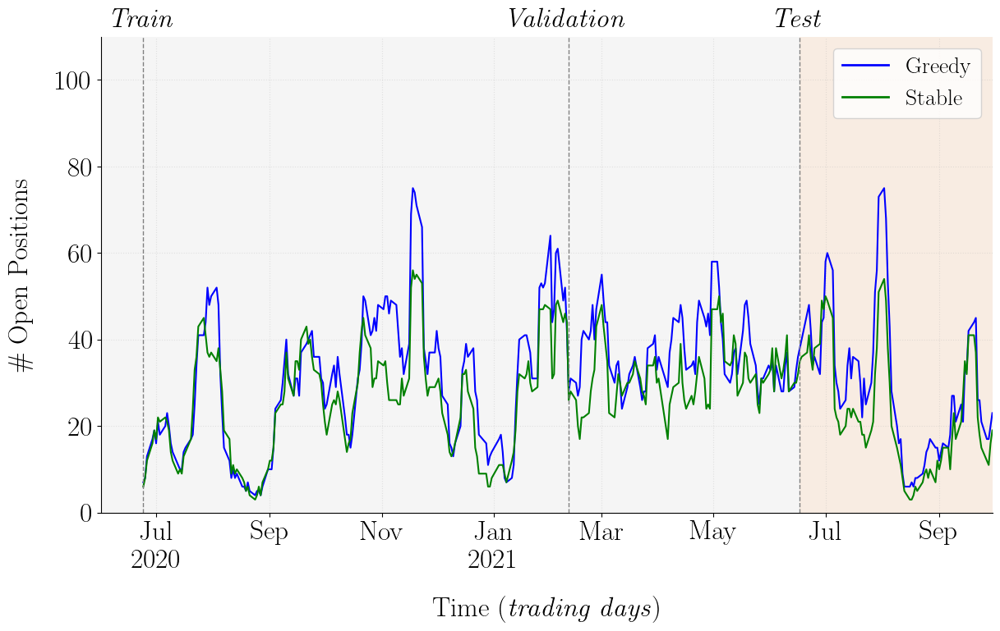

In [50]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
import numpy as np

# Custom date formatter
class CustomDateFormatter(mdates.DateFormatter):
    def __init__(self, fmt="%b-%Y", *args, **kwargs):
        super().__init__(fmt, *args, **kwargs)
        self.fmt = fmt
        self.last_year = None
        
    def __call__(self, x, pos=0):
        dt = mdates.num2date(x)
        if self.last_year != dt.year:
            self.last_year = dt.year
            return dt.strftime("%b\n%Y")
        else:
            return dt.strftime("%b")  # Months in TEXTUAL format

# Initialize the plot
fig, ax = plt.subplots(figsize=(14, 10))

# Set the background color to grey
ax.set_facecolor('#f5f5f5')

# Define colors for the trading rules
colors = {'Greedy': 'blue', 'Stable': 'green'}

# Plot number of open positions for each algorithm
for algo in ['Greedy', 'Stable']:
    data = trading_signal_evolution_all[algo]['All']
    ax.plot(data.index, data['total_trading_signal'],
            label=algo,
            color=colors[algo],
            linestyle='-')

# Set y-axis limits from 0 to 110
ax.set_ylim(0, 110)

# Add vertical lines for each split
for split in ['Train', 'Validation', 'Test']:
    split_start = trading_signal_evolution_all['Greedy'][split].index[0]
    ax.axvline(x=split_start, color='grey', linestyle='--', linewidth=1)
    # Adjust text position to work with new y-axis limits
    ax.text(split_start, 111, f'\\textit{{{split}}}',
            horizontalalignment='center', verticalalignment='bottom',
            fontsize=TICK_FONTSIZE, fontstyle='italic')
    if split == 'Test':
        end_split = split_start
        # Shade area to the right of the "Test" split
        ax.axvspan(end_split, trading_signal_evolution_all['Greedy']['Test'].index[-1],
                  facecolor='peachpuff', alpha=0.3)

# Customize grid
ax.grid(True, alpha=0.3, linestyle=':')

# Create proxy artists for the legend
legend_elements = [Line2D([0], [0], color='blue', lw=2, label='Greedy'),
                  Line2D([0], [0], color='green', lw=2, label='Stable')]

# Adjust the bottom margin
plt.subplots_adjust(bottom=0.3)

# Add labels and title
ax.set_xlabel('Time (\\textit{trading days})', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
ax.set_ylabel('\\# Open Positions', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Set tick parameters
ax.tick_params(axis='both', which='major', labelsize=TICK_FONTSIZE)
ax.set_xlim(right=trading_signal_evolution_all['Greedy']['Test'].index[-1])

# Set x-axis formatter
ax.xaxis.set_major_formatter(CustomDateFormatter())

# Set title if not saving
if not save_this_plot:
    ax.set_title(f'Evolution of Open Positions $~\mid~ (L={L},~\\theta = \\lfloor {prop_of_k}k \\rfloor)$ ',
                fontsize=TITLE_FONTSIZE, pad=50)

# Add legend
ax.legend(handles=legend_elements, fontsize=LEGEND_FONTSIZE)

# Save the plot if requested
if save_this_plot:
    plt.savefig(os.path.join(path_output, f'fig_{model}_Open_Positions.pdf'),
                bbox_inches='tight')

# Show the plot
plt.show()

### Portfolio Metrics

Portfolio returns:
$$\mu^{\mathcal{P}}=\frac{1}{|\tilde{\mathfrak{d}}|} \sum_{d \in \tilde{\mathfrak{d}}} \ln \left(1+r_{d}^{\mathcal{P}}\right)$$
The standard deviation:
$$ \sigma^{\mathcal{P}}=\sqrt{\frac{1}{|\tilde{\mathfrak{d}}|-1} \sum_{d \in \tilde{\mathfrak{d}}}\left[\ln \left(1+r_{d}^{\mathcal{P}}\right)-\mu^{\mathcal{P}}\right]^2} $$
The annualized Sharpe Ratio:
$$ SR^{\mathcal{P}}=\frac{\mu^{\mathcal{P}}}{\sigma^{\mathcal{P}}} \sqrt{252} $$

In [51]:
def portfolio_statistics(r_P):
    from scipy import stats
    import numpy as np
    # Cumulative return series
    cum_r_P_series = (1 + r_P).cumprod()

    # Final cumulative return
    # cum_r_P_final = cum_r_P_series.iloc[-1]
    cum_r_P_final = (1 + r_P).prod()

    # Compute log returns
    log_returns = np.log(1 + r_P)

    # Annualized metrics
    ann_factor = 252
    μ_P = (1 + r_P).prod() ** (ann_factor / len(r_P)) - 1
    σ_P = np.std(log_returns, ddof=1) * np.sqrt(ann_factor)
    
    # Sharpe Ratio
    SR_P = (np.mean(log_returns) / np.std(log_returns, ddof=1)) * np.sqrt(ann_factor)
    # SR_P = (np.mean(r_P) / np.std(r_P, ddof=1)) * np.sqrt(ann_factor) # Very similar to the above line
    
    # Sortino Ratio
    downside_returns = r_P[r_P < 0]
    downside_deviation = np.sqrt(np.mean(downside_returns**2) * ann_factor)
    Sortino_Ratio = μ_P / downside_deviation if downside_deviation != 0 else np.nan

    # Maximum Drawdown (MDD)
    running_max = cum_r_P_series.cummax()
    drawdowns = (cum_r_P_series - running_max) / running_max
    MDD = drawdowns.min() # Maximum Drawdown as a positive value

    # Calmar Ratio
    N_days = len(r_P)
    annualized_return = (cum_r_P_final) ** (252 / N_days) - 1
    Calmar_Ratio = annualized_return / abs(MDD) if MDD != 0 else np.nan

    # Skewness and Kurtosis of log returns
    # skewness = stats.skew(log_returns)
    # kurtosis = stats.kurtosis(log_returns, fisher=True) # Excess Kurtosis = Regular Kurtosis - 3 (Fisher's definition)
    ann_returns = r_P * np.sqrt(ann_factor)
    skewness = stats.skew(ann_returns)
    kurtosis = stats.kurtosis(ann_returns, fisher=True) # Excess Kurtosis = Regular Kurtosis - 3 (Fisher's definition)

    # Value at Risk (VaR) and Conditional Value at Risk (CVaR) - Assuming 95% Confidence Level => alpha = 0.05
    alpha = 0.05
    
    VaR_95 = np.percentile(r_P, 100 * alpha)
    tail_returns = r_P[r_P <= VaR_95]
    CVaR_95 = tail_returns.mean() if len(tail_returns) > 0 else np.nan
    
    VaR_95 = VaR_95 * np.sqrt(ann_factor) # Annualize the VaR
    CVaR_95 = CVaR_95 * np.sqrt(ann_factor) # Annualize the CVaR

    return {
        'cum_r_P_final': cum_r_P_final,
        'μ_P': μ_P,
        'σ_P': σ_P,
        'SR_P': SR_P,
        'Sortino_Ratio': Sortino_Ratio,  
        'MDD': MDD,
        'Calmar_Ratio': Calmar_Ratio,
        'skewness': skewness,
        'kurtosis': kurtosis,
        'VaR_95': VaR_95,
        'CVaR_95': CVaR_95
    }
    

In [52]:
P_statistics = {
    'All': {}, 'Train': {}, 'Validation': {}, 'Test': {}
}

# Loop to apply portfolio_statistics function to each dataframe in r_P_dict
for split, r_P in r_P_dict.items():
    if split not in ['trading_signal_evolution', 'turnover_stats']:  # Skip non-return entries
        for TR_key in TradingRule_dict.keys():
            P_statistics[split][TR_key] = {
                'gross': portfolio_statistics(r_P[(TR_key, 'gross')]),
                'net': portfolio_statistics(r_P[(TR_key, 'net')])
            }

# Calculate cumulative returns for each split, trading rule, and return type
cumulative_returns = {
    'Train': {
        'gross': (1 + pd.DataFrame({TR: r_P_train[(TR, 'gross')] for TR in TradingRule_dict.keys()})).cumprod(),
        'net': (1 + pd.DataFrame({TR: r_P_train[(TR, 'net')] for TR in TradingRule_dict.keys()})).cumprod()
    },
    'Validation': {
        'gross': (1 + pd.DataFrame({TR: r_P_val[(TR, 'gross')] for TR in TradingRule_dict.keys()})).cumprod(),
        'net': (1 + pd.DataFrame({TR: r_P_val[(TR, 'net')] for TR in TradingRule_dict.keys()})).cumprod()
    },
    'Test': {
        'gross': (1 + pd.DataFrame({TR: r_P_test[(TR, 'gross')] for TR in TradingRule_dict.keys()})).cumprod(),
        'net': (1 + pd.DataFrame({TR: r_P_test[(TR, 'net')] for TR in TradingRule_dict.keys()})).cumprod()
    }
}

In [53]:
caption                 = r"$\mathcal{P}_{\text{LLM}}$"
label                   = "LLM_portfolio_statistics"
subcaption_specific1    = r"Portfolio statistics of the trading strategy applied to the LLM clusters."
subcaption_specific2    = r"The holding period of the beta-neutral positions is set to $L$ = 4 trading days and the number of traded clusters is, $\theta = 0.5k=10$ as there are $k^*=20$ LLM clusters of article embeddings. The selection criteria for these hyperparameters ($L,\theta$) is based on maximizing the Sharpe Ratios of the train and validation samples."
# path_output             = "/Users/jesusvillotamiranda/Library/CloudStorage/OneDrive-UniversidaddeLaRioja/GitHub/Repository/TeX_Repo/__JBF_Submission__"

In [54]:
def generate_portfolio_tables(P_statistics, label, caption, subcaption_specific1, subcaption_specific2, path_output, save_tables=True):
    # Generate tables for both gross and net returns
    for return_type in ['gross', 'net']:
        table = "\\inserthere{tab:" + f"{label}_{return_type}" + "}\n"
        table += '\\begin{table}[H] \n'
        table += "\caption{Statistics of " + caption + " across data splits | " + return_type.capitalize() + " Returns} \n"
        table += r'''
\centering
\renewcommand{\arraystretch}{1.1} % Increased line spacing
% Define new column types for better spacing
\newcolumntype{P}[1]{>{\centering\arraybackslash}p{#1}}
{\footnotesize
\begin{tabular}{
 P{1.28cm} % Split
 P{0.9cm} % Algorithm
 P{0.9cm} % Cum. Return
 P{0.9cm} % Avg. Return
 P{0.9cm} % St. Deviation
 P{0.9cm} % Sharpe Ratio
 P{0.9cm} % Sortino Ratio
 P{0.9cm} % Max. Drawdown
 P{1cm} % Calmar Ratio
 P{0.9cm} % Skewness
 P{0.9cm} % Kurtosis
 P{0.9cm} % VaR
 P{0.9cm} % CVaR
}
\Xhline{2\arrayrulewidth}
\textbf{Split} & \textbf{Algo.} & \textbf{Cum. Ret.} & \textbf{Avg. Ret.} & \textbf{St. Dev.} & \textbf{Sharpe Ratio} & \textbf{Sortino Ratio} & \textbf{Max. DD} & \textbf{Calmar Ratio} & \textbf{Skew.} & \textbf{Exc. Kurt.} & \textbf{VaR 95\%} & \textbf{CVaR 95\%} \\
\Xhline{2\arrayrulewidth}
'''
        for split_name, split_dict in P_statistics.items():
            if split_name not in ['trading_signal_evolution', 'turnover_stats']:  # Skip non-return entries
                table += f"\\multirow{{2}}{{*}}{{{split_name}}}"  # Split row with multirow
                for TR_key, TR_stats in split_dict.items():
                    stats = TR_stats[return_type]
                    cum_r_P_final, μ_P, σ_P, SR_P, Sortino_Ratio, MDD, Calmar_Ratio, skewness, kurtosis, VaR_95, CVaR_95 = stats.values()
                    table += f" & \\textit{{{TR_key}}} & {cum_r_P_final:.3f} & {μ_P*100:.1f} & {σ_P*100:.1f} & {SR_P:.1f} & {Sortino_Ratio:.1f} & {MDD*100:.1f} & {Calmar_Ratio:.1f} & {skewness:.2f} & {kurtosis:.2f} & {VaR_95*100:.1f} & {CVaR_95*100:.1f} \\\\ "
                table += r" \hline "

        table += "\n" + r'\end{tabular}' + '\n }'
        table += f"\n \\label{{tab:{label}_{return_type}}}"
        
        # Add notes section
        table += r'''
        
\vspace{0.5cm}
\begin{minipage}{\textwidth}
\setlength{\parindent}{0pt}
{\footnotesize\textit{Note:
'''
        table += subcaption_specific1
        table += r'''
The statistics provided include performance metrics (Cumulative Return, Average Return (\%)), risk measures (Standard Deviation (\%), Maximum Drawdown (\%), Value at Risk (\%), Conditional Value at Risk (\%)), risk-adjusted performance ratios (Sharpe Ratio, Sortino Ratio, Calmar Ratio), and return distribution characteristics (Skewness, Excess Kurtosis). These statistics are provided for both cluster-selection algorithms: Greedy and Stable.
Except for the Cumulative Return, all returns are annualized. The Sharpe Ratio is computed using the daily returns, assuming 252 trading days in a year. The Sortino Ratio is calculated using the daily downside returns. The Maximum Drawdown is the maximum loss from a peak to a trough. The Calmar Ratio is the ratio of the annualized return to the maximum drawdown. Skewness measures the asymmetry of the return distribution, while Kurtosis quantifies the tails' thickness. The Value at Risk (VaR) and Conditional Value at Risk (CVaR) are calculated at a 95\% confidence level.
The Greedy algorithm longs (shorts) clusters that maximize (minimize) the cluster-average-$SR$ in the validation sample subject to a positivity (negativity) constraint, while the Stable algorithm longs (shorts) clusters that minimize the rank difference between the training and validation rankings of the cluster-average-$SR$'s subject to a positivity (negativity) constraint, which is now imposed on both sample splits. In both algorithms, the cardinality of each leg is upper-bounded by a hyperparameter $\theta$.
'''
        table += subcaption_specific2
        table += r'''
}}
\end{minipage}
\end{table}
'''
        # print(f"\nTable for {return_type} returns:")
        print(table)
        
        if save_tables:
            with open(path_output + f'/tab_{model}_Portfolio_Statistics_{return_type.upper()}.tex', 'w') as file:
                file.write(table)

# Usage example:
generate_portfolio_tables(
    P_statistics=P_statistics,
    label=label,
    caption=caption,
    subcaption_specific1=subcaption_specific1,
    subcaption_specific2=subcaption_specific2,
    path_output=path_output,
    save_tables=True
)

\inserthere{tab:LLM_portfolio_statistics_gross}
\begin{table}[H] 
\caption{Statistics of $\mathcal{P}_{\text{LLM}}$ across data splits | Gross Returns} 

\centering
\renewcommand{\arraystretch}{1.1} % Increased line spacing
% Define new column types for better spacing
\newcolumntype{P}[1]{>{\centering\arraybackslash}p{#1}}
{\footnotesize
\begin{tabular}{
 P{1.28cm} % Split
 P{0.9cm} % Algorithm
 P{0.9cm} % Cum. Return
 P{0.9cm} % Avg. Return
 P{0.9cm} % St. Deviation
 P{0.9cm} % Sharpe Ratio
 P{0.9cm} % Sortino Ratio
 P{0.9cm} % Max. Drawdown
 P{1cm} % Calmar Ratio
 P{0.9cm} % Skewness
 P{0.9cm} % Kurtosis
 P{0.9cm} % VaR
 P{0.9cm} % CVaR
}
\Xhline{2\arrayrulewidth}
\textbf{Split} & \textbf{Algo.} & \textbf{Cum. Ret.} & \textbf{Avg. Ret.} & \textbf{St. Dev.} & \textbf{Sharpe Ratio} & \textbf{Sortino Ratio} & \textbf{Max. DD} & \textbf{Calmar Ratio} & \textbf{Skew.} & \textbf{Exc. Kurt.} & \textbf{VaR 95\%} & \textbf{CVaR 95\%} \\
\Xhline{2\arrayrulewidth}
\multirow{2}{*}{All} & \textit

KeyError: 'Greedy'

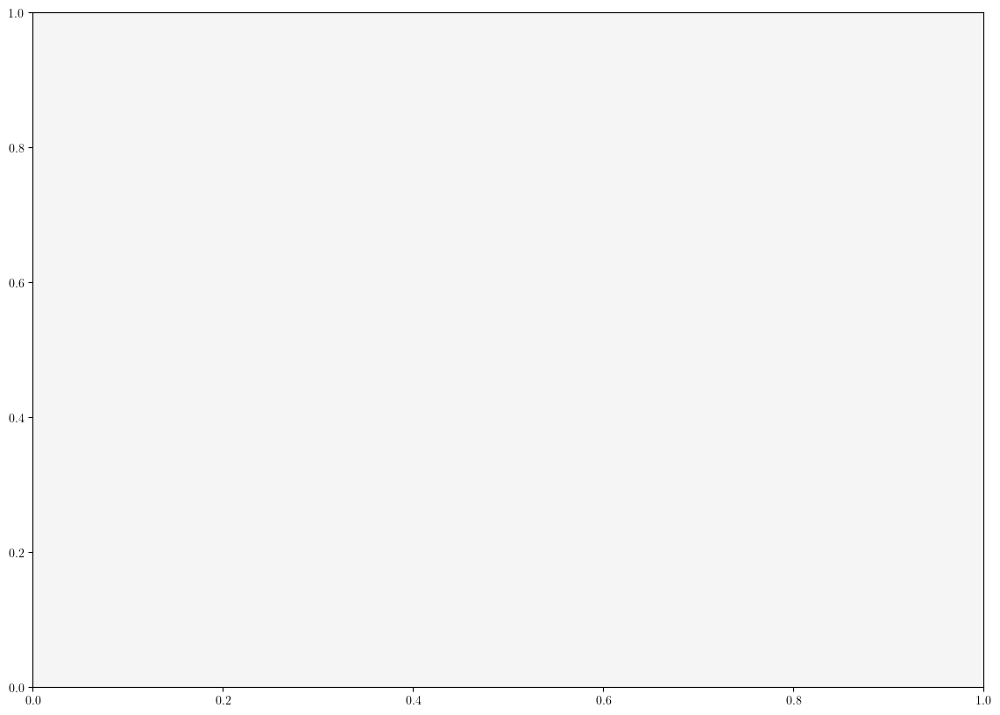

In [55]:
save_this_plot = True

#===============================================================================================================

# Custom date formatter
class CustomDateFormatter(mdates.DateFormatter):
    def __init__(self, fmt="%b-%Y", *args, **kwargs):
        super().__init__(fmt, *args, **kwargs)
        self.fmt = fmt
        self.last_year = None

    def __call__(self, x, pos=0):
        dt = mdates.num2date(x)
        if self.last_year != dt.year:
            self.last_year = dt.year
            return dt.strftime("%b\n%Y")
        else:
            return dt.strftime("%b")      # Uncomment for: Months in TEXTUAL format
            # return dt.strftime("%m")    # Uncomment for: Months in NUMERIC format
        
#===============================================================================================================

# Initialize the plot
fig, ax = plt.subplots(figsize=(14, 10))  # (14,8)

# Set the background color to grey
ax.set_facecolor('#f5f5f5')

# Define colors for the trading rules
colors = {'Greedy': 'blue', 'Stable': 'green'}

# Plot cumulative returns for each split and each Trading Rule
for split, returns in cumulative_returns.items():
    for rule in TradingRule_dict.keys():
        ax.plot(returns[rule].index, returns[rule].values, 
                label=rule, 
                color=colors[rule], 
                linestyle='-')

# Add vertical lines for each split and shade area to the right of the "Train" split
for split in ['Train', 'Validation', 'Test']:
    split_start = cumulative_returns[split].index[0]
    ax.axvline(x=split_start, color='grey', linestyle='--', linewidth=1)
    ax.text(split_start, ax.get_ylim()[1] * 1.005, f'\\textit{{{split}}}', 
            horizontalalignment='center', verticalalignment='bottom', fontsize=TICK_FONTSIZE, fontstyle='italic')
    
    if split == 'Test':
        end_split = split_start  # Save the end date of the train split for shading

# Shade area to the right of the "Test" split
ax.axvspan(end_split, cumulative_returns['Test'].index[-1], facecolor='peachpuff', alpha=0.3) ## Colors: ["lightcoral", "lightblue", "lightgreen", "lightyellow", "lightgrey", "lightpink", "lightcyan", "lightgoldenrodyellow", "lavender", "mistyrose", "peachpuff"]


# Add horizontal line at 1
ax.axhline(y=1, color='grey', linestyle='--', linewidth=1)

# Customize grid
ax.grid(True, alpha=0.3, linestyle=':')  # Set grid transparency and linestyle to dotted

# Create proxy artists for the legend
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color='blue', lw=2, label='Greedy'),
                   Line2D([0], [0], color='green', lw=2, label='Stable')]

# Adjust the bottom margin to make room for the labels
plt.subplots_adjust(bottom=0.3)

# Add labels and title
ax.set_xlabel('Time (\\textit{trading days})', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
ax.set_ylabel('Cumulative Returns', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Set tick parameters
ax.tick_params(axis='both', which='major', labelsize=TICK_FONTSIZE)
ax.set_xlim(right=cumulative_returns['Test'].index[-1]) # Ensures that the x-axis ends at the last date

# Set x-axis formatter
ax.xaxis.set_major_formatter(CustomDateFormatter())            

# Optionally set the title
ax.set_title(f'Cumulative Returns across data splits $~\mid~ (L={L},~\\theta = \\lfloor {prop_of_k}k \\rfloor)$ ', fontsize=TITLE_FONTSIZE, pad=50) if not save_this_plot else None

# Add legend
ax.legend(handles=legend_elements, fontsize=LEGEND_FONTSIZE)

# Save the plot if requested
plt.savefig(os.path.join(path_output, f'{model}_Portfolio_Cum_Returns.pdf'), bbox_inches='tight') if save_this_plot else None

# Show the plot
plt.show()


#
---
---

# **Distribution of Cluster-Average Sharpe Ratios $\overline{SR}_g$**

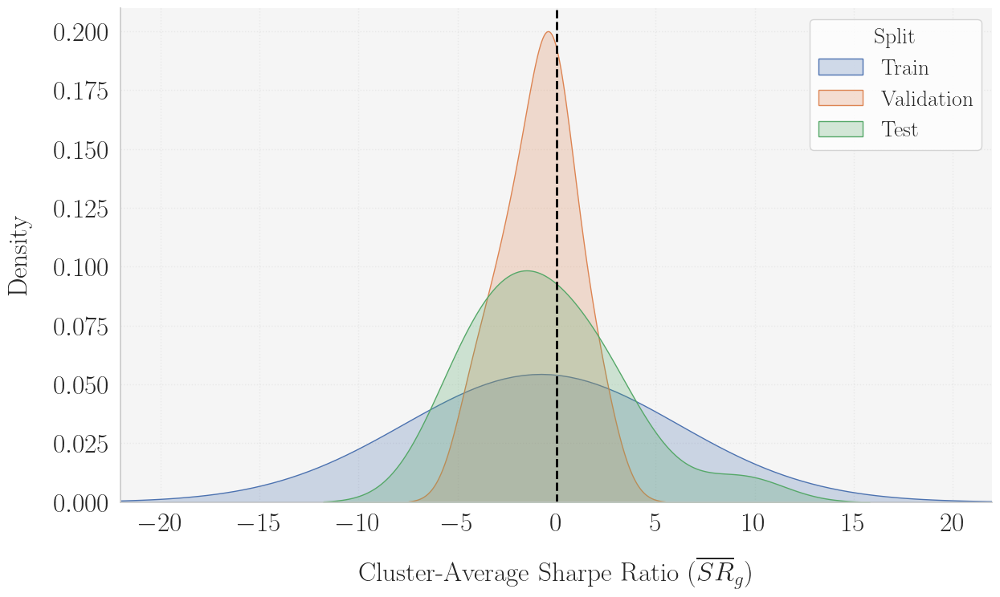

In [ ]:
save_this_plot  = True

#===============================================================================================================

# Prepare data for plotting
data = []
for (split, cluster), avg_sr in SR_Average_dict.items():
    data.append((split, avg_sr))

# Create a DataFrame for easier plotting with seaborn
df_sr = pd.DataFrame(data, columns=['Split', 'Average_SR'])

# Set the plotting style
sns.set(style="whitegrid")

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

# Initialize the figure
plt.figure(figsize=(14, 8))

# Create a density plot for the distribution of Sharpe Ratios across each split
# Use a loop to ensure labels are set for the legend
splits = df_sr['Split'].unique()
for split in splits:
    subset = df_sr[df_sr['Split'] == split]
    sns.kdeplot(subset['Average_SR'], label=split, fill=True, common_norm=False)

# Set y-axis limits
plt.ylim(0, 0.21)

# Customize the plot
plt.title('Distribution of Cluster-Average Sharpe Ratios by Split', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if not save_this_plot else None
plt.xlabel('Cluster-Average Sharpe Ratio ($\\overline{SR}_g$)', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.ylabel('Density', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.xticks(fontsize=TICK_FONTSIZE)
plt.yticks(fontsize=TICK_FONTSIZE)

plt.xticks(range(-30, 31, 5))  # Set x-ticks from -30 to 30 with step of 5
plt.xlim(-22, 22)  # Set x-axis limits from -30 to 30

plt.grid(True, alpha=0.3, linestyle=':')
plt.gca().set_facecolor('#f5f5f5')  # Set the background color of the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.axvline(x=0, color='black', linestyle='--', linewidth=2)

# Add the legend with the specified font size
plt.legend(title='Split', fontsize=LEGEND_FONTSIZE, title_fontsize=LEGEND_FONTSIZE)

plt.savefig(os.path.join(path_output, f'fig_{model}_Cluster-Avg_SR_Distribution.pdf'), bbox_inches='tight') if save_this_plot else None
# Show the plot
plt.show()


#
---
---

# **Robustness Checks**

## **1) Holding Period Length $(L)$**

In [ ]:
P_statistics_dict_L = {}
prop_of_k = 0.5
θ = int(prop_of_k*k_opt)    # Number of Traded clusters
grid_L = range(1,101)  # Define the grid of holding periods

In [ ]:
def compute_P_statistics(L):
    print('=*'*80)
    print(f'Processing {L=}')
    print('=*'*80)

    SR_split_cluster_dict = {}  # Initialize dictionary to store sum of SR and count of observations for each cluster and split

    for idx_row, row in B.iterrows():
        TS_data = TS_dict[idx_row]
        if TS_data is not None and isinstance(TS_data, pd.DataFrame) and len(TS_data) > L:
            split = row['split']
            cluster = row['cluster']
            SR_L = TS_data['SR'][L]

            # Create dictionary keys if they don't exist
            if (split, cluster) not in SR_split_cluster_dict:
                SR_split_cluster_dict[(split, cluster)] = {'SR_sum': 0, 'count': 0}

            # Accumulate SR values and count
            SR_split_cluster_dict[(split, cluster)]['SR_sum'] += SR_L  # Accumulate the SR values
            SR_split_cluster_dict[(split, cluster)]['count'] += 1  # Increment the count

    SR_split_cluster_dict = OrderedDict(sorted(SR_split_cluster_dict.items(), key=lambda x: x[0][1]))  # Sort the dictionary by cluster number

    SR_Average_dict = {}  # Initialize dictionary to store average SR for each cluster and split
    for (split, cluster), values in SR_split_cluster_dict.items():
        if values['count'] > 0:
            SR_Average_dict[(split, cluster)] = values['SR_sum'] / values['count']  # Compute the average SR
        else:
            SR_Average_dict[(split, cluster)] = float('nan')  # or 0 if you prefer

    SR_split_dict = {}  # Group the average SRs by splits
    for (split, cluster), avg_sr in SR_Average_dict.items():
        if split not in SR_split_dict:
            SR_split_dict[split] = []
        SR_split_dict[split].append((cluster, avg_sr))

    SR_Ranking_dict = {}  # Sort and rank the SRs within each split
    for split, sr_list in SR_split_dict.items():
        SR_Ranking_dict[split] = sorted(sr_list, key=lambda x: x[1], reverse=True)

    #================ GREEDY ALGORITHM ================#
    # Initialize the sets for clusters
    G_SR_plus_train = set()
    G_SR_minus_train = set()
    G_SR_plus_val = set()
    G_SR_minus_val = set()
    G_SR_plus_test = set()
    G_SR_minus_test = set()

    # Iterate through the ranked SRs and classify the clusters
    for split, ranked_sr in SR_Ranking_dict.items():
        for cluster, avg_sr in ranked_sr:
            if split == 'Train':
                if avg_sr > 0:
                    G_SR_plus_train.add(cluster)
                else:
                    G_SR_minus_train.add(cluster)
            elif split == 'Validation':
                if avg_sr > 0:
                    G_SR_plus_val.add(cluster)
                else:
                    G_SR_minus_val.add(cluster)
            elif split == 'Test':
                if avg_sr > 0:
                    G_SR_plus_test.add(cluster)
                else:
                    G_SR_minus_test.add(cluster)

    # Sort clusters in the validation sample by average SR
    sorted_positive_val = sorted(G_SR_plus_val, key=lambda cluster: SR_Average_dict[('Validation', cluster)], reverse=True)
    sorted_negative_val = sorted(G_SR_minus_val, key=lambda cluster: SR_Average_dict[('Validation', cluster)], reverse=False)

    # Select the top θ positions, upper bounded by the cardinality of the G_SR sets
    G_θ_plus = sorted_positive_val[:min(θ, len(sorted_positive_val))]
    G_θ_minus = sorted_negative_val[:min(θ, len(sorted_negative_val))]

    B['TR_Greedy'] = 0.0
    B.loc[B['cluster'].isin(G_θ_plus), 'TR_Greedy'] = 1.0
    B.loc[B['cluster'].isin(G_θ_minus), 'TR_Greedy'] = -1.0

    #================ STABLE ALGORITHM ================#
    Split1 = 'Train'
    Split2 = 'Validation'

    # Calculate the ranks for each cluster in each split
    ranks = {split: {cluster: rank for rank, (cluster, _) in enumerate(ranked_sr, start=1)}
            for split, ranked_sr in SR_Ranking_dict.items()}

    # Extract the common clusters across Split1 and Split2
    common_clusters = set(ranks[Split1]).intersection(ranks[Split2])

    # Calculate Spearman rank correlation coefficient for the ranks between Split1 and Split2
    split1_ranks = []
    split2_ranks = []
    for cluster in common_clusters:
        split1_ranks.append(ranks[Split1][cluster])
        split2_ranks.append(ranks[Split2][cluster])

    rank_differences = {cluster: abs(ranks[Split1][cluster] - ranks[Split2][cluster]) for cluster in common_clusters}  # Calculate the absolute rank differences between Split1 and Split2
    sorted_rank_differences = sorted(rank_differences.items(), key=lambda x: x[1])  # Sort clusters by the absolute rank differences
    most_stable_clusters = [cluster for cluster, _ in sorted_rank_differences[:2*θ]]  # Select the top θ clusters with the smallest rank differences

    # Determine long and short positions based on average Sharpe Ratios
    long_clusters = [cluster for cluster in most_stable_clusters if SR_Average_dict[(Split1, cluster)] > 0 and SR_Average_dict[(Split2, cluster)] > 0]
    short_clusters = [cluster for cluster in most_stable_clusters if SR_Average_dict[(Split1, cluster)] < 0 and SR_Average_dict[(Split2, cluster)] < 0]

    B['TR_RankStable'] = 0.0
    B.loc[B['cluster'].isin(long_clusters), 'TR_RankStable'] = 1.0
    B.loc[B['cluster'].isin(short_clusters), 'TR_RankStable'] = -1.0

    TradingRule_dict = {
        'Greedy': 'TR_Greedy',
        'Stable': 'TR_RankStable'
    }

    # Create a loop to calculate the portfolio returns for each Trading Rule, storing in the same dataframe r_P_all for both Trading Rules, r_P_train for both Trading Rules, r_P_val for both Trading Rules, and r_P_test for both Trading Rules
    r_P_all, r_P_train, r_P_val, r_P_test = {}, {}, {}, {}

    for key, TR in TradingRule_dict.items():
        r_P_dict = calculate_portfolio_returns(B, 𝖉, L, TS_dict, TradingRule=TR, verbose=False)
        r_P_all[key] = r_P_dict['All']['returns']
        r_P_train[key] = r_P_dict['Train']['returns']
        r_P_val[key] = r_P_dict['Validation']['returns']
        r_P_test[key] = r_P_dict['Test']['returns']

    # Convert into a dataframe
    del r_P_dict
    r_P_all, r_P_train, r_P_val, r_P_test = pd.DataFrame(r_P_all), pd.DataFrame(r_P_train), pd.DataFrame(r_P_val), pd.DataFrame(r_P_test)
    r_P_dict = {'All': r_P_all, 'Train': r_P_train, 'Validation': r_P_val, 'Test': r_P_test}

    P_statistics = {'All': {}, 'Train': {}, 'Validation': {}, 'Test': {}}

    # Loop to apply portfolio_statistics function to each dataframe in r_P_dict
    for split, r_P in r_P_dict.items():
        for TR_key in TradingRule_dict.keys():
            r_P_series = r_P[TR_key]
            cum_r_P_final, μ_P, σ_P, SR_P = portfolio_statistics(r_P_series)
            P_statistics[split][TR_key] = {
                'cum_r_P_final': cum_r_P_final,
                'μ_P': μ_P,
                'σ_P': σ_P,
                'SR_P': SR_P
            }

    return L, P_statistics


### Obtain the ``P_statistics`` for a grid of $L$

In [ ]:
# Use joblib to parallelize the computation
results_L = Parallel(n_jobs=-1)(delayed(compute_P_statistics)(L) for L in grid_L)

# Collect the results
P_statistics_dict_L = {L: P_statistics for L, P_statistics in results_L}

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.008946001334631972' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.008946001334631972' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0056713291601988' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.009233689767059286' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006311126479513015' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00586503324562155' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.004283473605252278' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.008473223006003866' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0030789851389131802' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002230221340400142' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00586503324562155' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00586503324562155' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0024627933277772073' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0075022466881611875' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0075022466881611875' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0075022466881611875' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0075022466881611875' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.003722612436368025' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.004425956222579779' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005413656423099657' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005413656423099657' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.004017952593306012' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.004790945677280871' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002583284117455286' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.004286797926532949' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0033384489853355193' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002997368995982549' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.004717431192497041' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0020251565793886935' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0031054659509138056' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001614709777605035' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001614709777605035' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.013380396449392477' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.013380396449392477' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011564375881018502' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001492580572097572' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0010439994357308087' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.013380396449392477' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0018110946216748388' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0019820983017504053' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0019530720540067447' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002088840505345153' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-9.638411756865643e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0022165775782398748' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009006154771202188' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005413656423099657' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0019948620810266698' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010472859783866154' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002042396355398948' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005413656423099657' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005413656423099657' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0019662830736906435' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009562825722630095' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014917860192359713' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010739460968539833' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012509602102037487' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006286625931182025' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010739460968539833' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009199632120686128' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0012853928744791384' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002426758241069983' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0014493546572771291' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010081225003262897' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00017993381054928946' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647g

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009183231162451544' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005275672699348929' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0025011661831502397' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0007864028756793588' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0019373323266433323' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '6.043227571527099e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001886953552096121' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014269185043244152' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0008420036456490257' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005718473702465697' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002871126636156695' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005700371367494779' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '9.802219483987908e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006112022289451447' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001142139652271244' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0010405927477723793' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4.5577683607492256e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006086860022505806' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017958904510725314' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0010714434908157702' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '3.738664182408775e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0011332250367333575' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0005153488062377699' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '8.685790744166868e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001077257791344724' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009957111309122834' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0010113715328535112' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00027851330092379975' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0015049192230244374' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001502249700422025' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001414203257815222' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00011193558069823134' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0004813534571164305' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0004813534571164305' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00011931592985705619' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '8.879622233354683e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007098167211646767' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00012676587873946272' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00010170048700860547' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009518012137508192' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00020471324539955577' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011682698764635664' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.026076972374247956' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0001541650242577078' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0004216883613470609' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001614709777605035' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001614709777605035' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0014308764874120298' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0001860891971717815' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0003853703160599026' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007906427494964113' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0016896377195206188' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0015739961060977992' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00011941981575480534' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017988757156718993' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0002657348581752003' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '7.508758052427345e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017123760547427134' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00030896650170072484' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014362825173648965' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0008923370397929342' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012853972644331945' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '7.798573661387037e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.000666650421559257' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.008082936037350037' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017244207845308948' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00037876557174333647' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0008567123780882686' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.000983878767337715' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009328340935616519' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0006179985298859055' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011525968540600342' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011807174786201337' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.008082936037350037' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.008082936037350037' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0016039457679817382' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014138223956421318' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0019773924297049987' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007671584417057707' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0008666205911347922' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.000810608621224951' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00040779512219997526' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0004773873802818264' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001888972633343804' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0016448850448817056' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0018210055774663854' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0013742351530542543' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0016908269842966738' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007830864552067124' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007617140628037061' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007337759067638847' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00162764220530832' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0005220113395021816' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017821341564456857' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0016043825571850831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005160683850054358' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009908495172542054' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001103021505415286' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011414290880841626' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0005799894459667753' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0015404741864025442' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.5970379681787856e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001403560818012932' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0005911275606639937' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017035914513496922' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.754944655013303e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001537243240379753' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009120929764423395' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009241583311628907' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009143348496588686' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0011871554985071581' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0009030733752062447' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '8.951206458119725e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0016330799162999896' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00018662247160395812' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001219769546147881' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014779822988701787' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0005910520194233655' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-9.118012205517657e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001437162452070704' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00014387481365054662' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014600716501058531' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0013335968607847532' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012903611363667374' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012727386231381344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005628527474336597' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005686558567908757' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0015794837495077014' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00029197233242137346' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0005034518961593024' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00016926846199852923' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005706516393137237' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005282118256971373' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005266013538142378' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00039952729247189306' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014068634766581703' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00024366643548018717' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012833087476443955' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00028931324277869144' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006270097374849021' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011816319041755353' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010731666243371258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006272009335531068' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012428988967010774' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00018849682039040176' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00018267113178791204' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00020285980761059757' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00036450335635788023' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001614709777605035' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001614709777605035' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00010070460295020477' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012114298210423847' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0017476939566147542' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010259246200656036' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00019769231847052203' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0002982303665822449' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005865421857988486' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00015861713486776228' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00024470770563699034' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00018974063492421432' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006672496753904975' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011922623861614044' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006459876132247984' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00010572032923934195' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006459876132247984' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00012593982098006343' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006335630962249202' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-6.24689629534623e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006826762652019392' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.410646891162233e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002597713372204233' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002597713372204233' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00769580980455747' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00769580980455747' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.999631370195e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006889448357657518' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00015904983376274578' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005176908297355276' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001274501254369977' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0015090071722765328' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014928168075540272' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '8.917199829622485e-06' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0008672064210273157' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010389755981102759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00019288311063319033' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00015566665192830856' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012441901390384522' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0006842040091511115' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00018098611517243103' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009812411290451213' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gt

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00029458633486779566' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00081791334754692' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0003330312754259701' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0013796403192090198' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.008946001334631972' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001193103726005258' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-5.836824302498971e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '9.957682595012157e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00769580980455747' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00769580980455747' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014559845919463067' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014170018281615955' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00023972681908096457' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.006694097050268831' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001303234309270497' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-9.806052200837581e-05' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014196176049722732' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00011114526032577363' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00048368964754196274' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0003290611984746755' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010158256043712292' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00016388251983342288' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001170025332331062' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00022467759320862554' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.00135708950485802' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001596630640233655' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012345579354673497' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012974268403911516' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0001849981344304305' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00022247765566697875' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0012639358842608545' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.014080948149649344' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010353141432651385' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0011319246414398356' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.010321690171656111' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00023583979409953478' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0002448453625684036' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0004028956426708001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009613274638527183' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0007152373304824064' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0009859822984023615' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001143743666531269' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0014531555529151683' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


- The robustness checks are done in the **Test** sample
- However, we also use this code to justify the choice of hyperparameters ($L=4$, $\theta = \lfloor 0.5k \rfloor$). In this case, we set `Split` = 'Train' and 'Validation'

In [ ]:
#===================================================

Split = 'Train'

#===================================================

In [ ]:
# Extract the series of Sharpe Ratios in the test set for each L
SR_test_set = {L: P_statistics_dict_L[L][Split] for L in grid_L}

# Extract Sharpe Ratios for each trading rule in the test set
SR_series_test = {L: {tr_key: stats['SR_P'] for tr_key, stats in SR_test_set[L].items()} for L in grid_L}

# Cnvert it to a DataFrame for easier   plotting
SR_df = pd.DataFrame(SR_series_test).T

# Select the first 50 L values
SR_subset = SR_df.head(20)

print(f'{SR_df.shape     = }')
print(f'{SR_subset.shape = }')

SR_df.shape     = (100, 2)
SR_subset.shape = (20, 2)


### Distribution or $SR$ in the Test Set

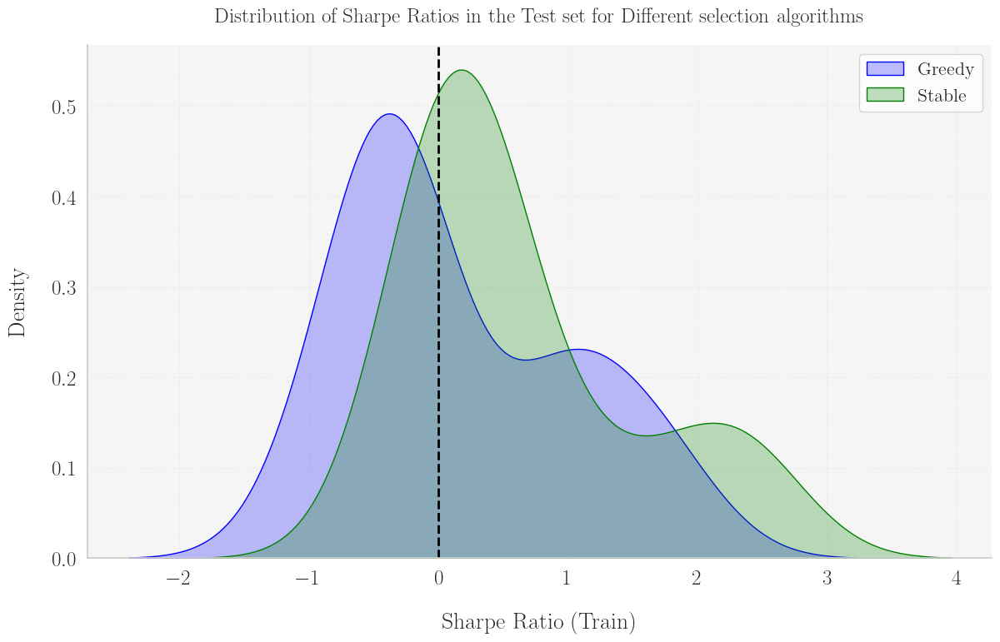

In [ ]:
save_this_plot = True
show_title = True

#===============================================================================================================

# Set the plotting style
sns.set(style="whitegrid")

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

colors = {'Greedy': 'blue', 'Stable': 'green'}

# Initialize the figure
plt.figure(figsize=(14, 8))

# Create a density plot for the distribution of Sharpe Ratios across each column
# Use a loop to ensure labels are set for the legend
for column in SR_subset.columns:
    sns.kdeplot(SR_subset[column], label=column, fill=True, common_norm=False, color=colors[column])

# Customize the plot
plt.title('Distribution of Sharpe Ratios in the Test set for Different selection algorithms', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
plt.xlabel(f'Sharpe Ratio ({Split})', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.ylabel('Density', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.xticks(fontsize=TICK_FONTSIZE)
plt.yticks(fontsize=TICK_FONTSIZE)

plt.axvline(x=0, color='black', linestyle='--', linewidth=2)

plt.grid(True, alpha=0.3, linestyle=':')
plt.gca().set_facecolor('#f5f5f5')  # Set the background color of the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add the legend with the specified font size
plt.legend(fontsize=LEGEND_FONTSIZE, title_fontsize=LEGEND_FONTSIZE, loc='best')

plt.savefig(os.path.join(path_output, f'{model}_RobustnessCheck_SR_Distribution_[{Split}]_[Change_L].pdf'), bbox_inches='tight') if save_this_plot else None

# Show the plot
plt.show()


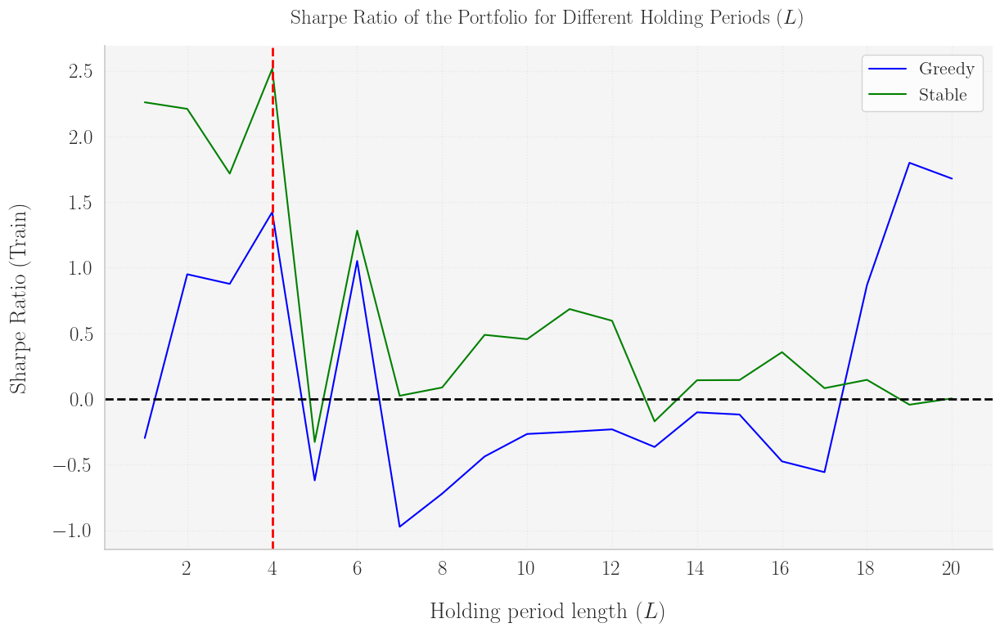

In [ ]:
save_this_plot = True
show_title = True

#===============================================================================================================

# Set the plotting style
sns.set(style="whitegrid")

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

colors = {'Greedy': 'blue', 'Stable': 'green'}

# Initialize the figure
plt.figure(figsize=(14, 8))

# Plot the Sharpe Ratios for each L
for column in SR_subset.columns:
    plt.plot(SR_subset.index, SR_subset[column], label=column, color=colors[column])

# Customize the plot
plt.title('Sharpe Ratio of the Portfolio for Different Holding Periods ($L$)', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
plt.xlabel('Holding period length ($L$)', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.ylabel(f'Sharpe Ratio ({Split})', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.xticks(fontsize=TICK_FONTSIZE)
plt.yticks(fontsize=TICK_FONTSIZE)
plt.grid(True, alpha=0.3, linestyle=':')
plt.gca().set_facecolor('#f5f5f5')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

xticks = list(range(2, len(SR_subset)+1, 2))  # Set xticks every 10
plt.xticks(xticks)
# ticks should not end in .0
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}'))

plt.axvline(x=4, color='red', linestyle='--', linewidth=2)     # plot a vertical line at L=4
plt.axhline(y=0, color='black', linestyle='--', linewidth=2)     # Add a horizontal line at 0

# Add a legend with larger font size
plt.legend(fontsize=LEGEND_FONTSIZE, loc='best')

plt.savefig(os.path.join(path_output, f'{model}_RobustnessCheck_SR_vs_L_[{Split}]_[Change_L].pdf'), bbox_inches='tight') if save_this_plot else None

# Show the plot
plt.show()


##
---

## **2) Number of Traded Clusters $(\theta)$**

In [ ]:
P_statistics_dict = {}
grid_θ = range(1, 15)  # Define the grid of number of traded clusters
L = 4

In [ ]:
from joblib import Parallel, delayed

def compute_P_statistics_θ(θ):
    print('=*'*80)
    print(f'Processing {θ=}')
    print('=*'*80)

    SR_split_cluster_dict = {}  # Initialize dictionary to store sum of SR and count of observations for each cluster and split

    for idx_row, row in B.iterrows():
        TS_data = TS_dict[idx_row]
        if TS_data is not None and isinstance(TS_data, pd.DataFrame) and len(TS_data) > L:
            split = row['split']
            cluster = row['cluster']
            SR_L = TS_data['SR'][L]

            # Create dictionary keys if they don't exist
            if (split, cluster) not in SR_split_cluster_dict:
                SR_split_cluster_dict[(split, cluster)] = {'SR_sum': 0, 'count': 0}

            # Accumulate SR values and count
            SR_split_cluster_dict[(split, cluster)]['SR_sum'] += SR_L  # Accumulate the SR values
            SR_split_cluster_dict[(split, cluster)]['count'] += 1  # Increment the count

    SR_split_cluster_dict = OrderedDict(sorted(SR_split_cluster_dict.items(), key=lambda x: x[0][1]))  # Sort the dictionary by cluster number

    SR_Average_dict = {}  # Initialize dictionary to store average SR for each cluster and split
    for (split, cluster), values in SR_split_cluster_dict.items():
        if values['count'] > 0:
            SR_Average_dict[(split, cluster)] = values['SR_sum'] / values['count']  # Compute the average SR
        else:
            SR_Average_dict[(split, cluster)] = float('nan')  # or 0 if you prefer

    SR_split_dict = {}  # Group the average SRs by splits
    for (split, cluster), avg_sr in SR_Average_dict.items():
        if split not in SR_split_dict:
            SR_split_dict[split] = []
        SR_split_dict[split].append((cluster, avg_sr))

    SR_Ranking_dict = {}  # Sort and rank the SRs within each split
    for split, sr_list in SR_split_dict.items():
        SR_Ranking_dict[split] = sorted(sr_list, key=lambda x: x[1], reverse=True)

    #================ GREEDY ALGORITHM ================#
    # Initialize the sets for clusters
    G_SR_plus_train = set()
    G_SR_minus_train = set()
    G_SR_plus_val = set()
    G_SR_minus_val = set()
    G_SR_plus_test = set()
    G_SR_minus_test = set()

    # Iterate through the ranked SRs and classify the clusters
    for split, ranked_sr in SR_Ranking_dict.items():
        for cluster, avg_sr in ranked_sr:
            if split == 'Train':
                if avg_sr > 0:
                    G_SR_plus_train.add(cluster)
                else:
                    G_SR_minus_train.add(cluster)
            elif split == 'Validation':
                if avg_sr > 0:
                    G_SR_plus_val.add(cluster)
                else:
                    G_SR_minus_val.add(cluster)
            elif split == 'Test':
                if avg_sr > 0:
                    G_SR_plus_test.add(cluster)
                else:
                    G_SR_minus_test.add(cluster)

    # Sort clusters in the validation sample by average SR
    sorted_positive_val = sorted(G_SR_plus_val, key=lambda cluster: SR_Average_dict[('Validation', cluster)], reverse=True)
    sorted_negative_val = sorted(G_SR_minus_val, key=lambda cluster: SR_Average_dict[('Validation', cluster)], reverse=False)

    # Select the top θ positions, upper bounded by the cardinality of the G_SR sets
    G_θ_plus = sorted_positive_val[:min(θ, len(sorted_positive_val))]
    G_θ_minus = sorted_negative_val[:min(θ, len(sorted_negative_val))]
    print(f'{G_θ_plus = }')
    print(f'{G_θ_minus = }')

    B['TR_Greedy'] = 0
    B.loc[B['cluster'].isin(G_θ_plus), 'TR_Greedy'] = 1
    B.loc[B['cluster'].isin(G_θ_minus), 'TR_Greedy'] = -1

    #================ STABLE ALGORITHM ================#
    Split1 = 'Train'
    Split2 = 'Validation'

    # Calculate the ranks for each cluster in each split
    ranks = {split: {cluster: rank for rank, (cluster, _) in enumerate(ranked_sr, start=1)}
            for split, ranked_sr in SR_Ranking_dict.items()}

    # Extract the common clusters across Split1 and Split2
    common_clusters = set(ranks[Split1]).intersection(ranks[Split2])

    # Calculate Spearman rank correlation coefficient for the ranks between Split1 and Split2
    split1_ranks = []
    split2_ranks = []
    for cluster in common_clusters:
        split1_ranks.append(ranks[Split1][cluster])
        split2_ranks.append(ranks[Split2][cluster])

    rank_differences = {cluster: abs(ranks[Split1][cluster] - ranks[Split2][cluster]) for cluster in common_clusters}  # Calculate the absolute rank differences between Split1 and Split2
    sorted_rank_differences = sorted(rank_differences.items(), key=lambda x: x[1])  # Sort clusters by the absolute rank differences
    most_stable_clusters = [cluster for cluster, _ in sorted_rank_differences[:2*θ]]  # Select the top θ clusters with the smallest rank differences

    # Determine long and short positions based on average Sharpe Ratios
    long_clusters = [cluster for cluster in most_stable_clusters if SR_Average_dict[(Split1, cluster)] > 0 and SR_Average_dict[(Split2, cluster)] > 0]
    short_clusters = [cluster for cluster in most_stable_clusters if SR_Average_dict[(Split1, cluster)] < 0 and SR_Average_dict[(Split2, cluster)] < 0]

    print(f'{long_clusters = }')
    print(f'{short_clusters = }')

    B['TR_RankStable'] = 0
    B.loc[B['cluster'].isin(long_clusters), 'TR_RankStable'] = 1
    B.loc[B['cluster'].isin(short_clusters), 'TR_RankStable'] = -1

    TradingRule_dict = {
        'Greedy': 'TR_Greedy',
        'Stable': 'TR_RankStable'
    }

    # Create a loop to calculate the portfolio returns for each Trading Rule, storing in the same dataframe r_P_all for both Trading Rules, r_P_train for both Trading Rules, r_P_val for both Trading Rules, and r_P_test for both Trading Rules
    r_P_all, r_P_train, r_P_val, r_P_test = {}, {}, {}, {}

    for key, TR in TradingRule_dict.items():
        r_P_dict = calculate_portfolio_returns(B, 𝖉, L, TS_dict, TradingRule=TR, verbose=False)
        r_P_all[key] = r_P_dict['All']['returns']
        r_P_train[key] = r_P_dict['Train']['returns']
        r_P_val[key] = r_P_dict['Validation']['returns']
        r_P_test[key] = r_P_dict['Test']['returns']

    # Convert into a dataframe
    del r_P_dict
    r_P_all, r_P_train, r_P_val, r_P_test = pd.DataFrame(r_P_all), pd.DataFrame(r_P_train), pd.DataFrame(r_P_val), pd.DataFrame(r_P_test)
    r_P_dict = {'All': r_P_all, 'Train': r_P_train, 'Validation': r_P_val, 'Test': r_P_test}

    P_statistics = {'All': {}, 'Train': {}, 'Validation': {}, 'Test': {}}

    # Loop to apply portfolio_statistics function to each dataframe in r_P_dict
    for split, r_P in r_P_dict.items():
        for TR_key in TradingRule_dict.keys():
            r_P_series = r_P[TR_key]
            cum_r_P_final, μ_P, σ_P, SR_P = portfolio_statistics(r_P_series)
            P_statistics[split][TR_key] = {
                'cum_r_P_final': cum_r_P_final,
                'μ_P': μ_P,
                'σ_P': σ_P,
                'SR_P': SR_P
            }

    return θ, P_statistics



### Obtain the ``P_statistics`` for a grid of $\theta$

In [ ]:
# Use joblib to parallelize the computation
results_θ = Parallel(n_jobs=-1)(delayed(compute_P_statistics_θ)(θ) for θ in grid_θ)

# Collect the results
P_statistics_dict_θ = {θ: P_statistics for θ, P_statistics in results_θ}

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00013615461395263822' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.00013615461395263822' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.017026961503011452' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0013947199037645586' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0006838205245370001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0006838205245370001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.005616564199745691' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0027123995791228685' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002176238974802087' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0017730943595457454' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0008047110122645578' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.001879899164772525' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.002307185779657446' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0005633959792540775' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.0010636767047476612' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002279329853055735' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002230221340400142' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0020864590524684976' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0024627933277772073' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0029224578555825027' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0011845618171391044' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8v

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002279329853055735' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0029224578555825027' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0024627933277772073' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0024627933277772073' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001482154705925666' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002279329853055735' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmb

/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0024627933277772073' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0024627933277772073' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vmbw0000gn/T/ipykernel_40336/950163412.py:42: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.002279329853055735' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
/var/folders/_j/7j25pgqd5z3dh647gtb8vm

In [ ]:
# Extract the series of Sharpe Ratios in the test set for each L
SR_test_set = {θ: P_statistics_dict_θ[θ][Split] for θ in grid_θ}

# Extract Sharpe Ratios for each trading rule in the test set
SR_series_test = {θ: {tr_key: stats['SR_P'] for tr_key, stats in SR_test_set[θ].items()} for θ in grid_θ}

# Cnvert it to a DataFrame for easier plotting
SR_df = pd.DataFrame(SR_series_test).T

print(f'{SR_df.shape     = }')

SR_df.shape     = (14, 2)


### Distribution or $SR$ in the Test Set

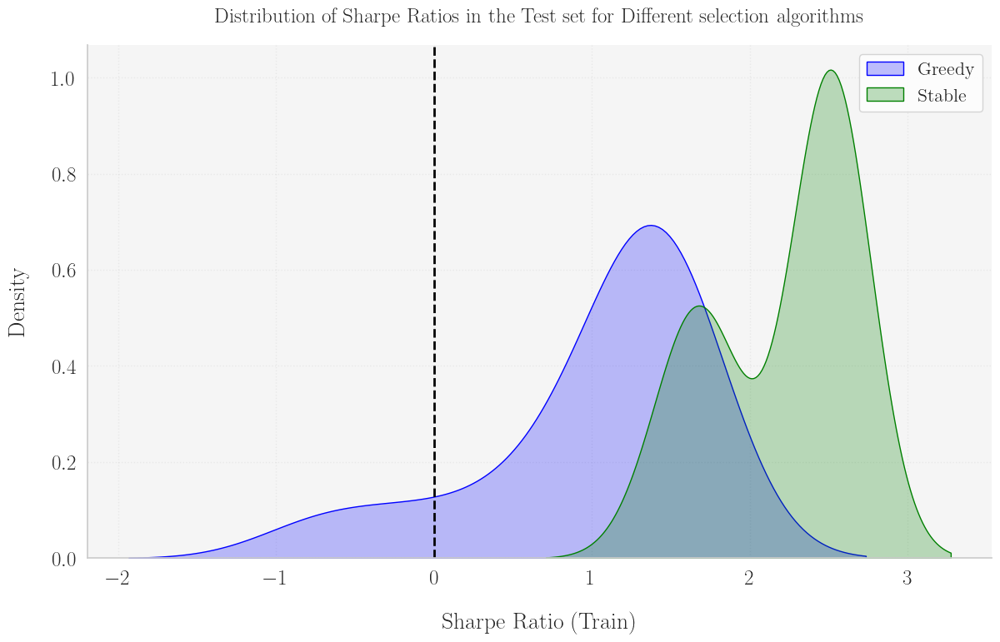

In [ ]:
save_this_plot = True
show_title = True

#===============================================================================================================

# Set the plotting style
sns.set(style="whitegrid")

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

colors = {'Greedy': 'blue', 'Stable': 'green'}

# Initialize the figure
plt.figure(figsize=(14, 8))

# Create a density plot for the distribution of Sharpe Ratios across each column
# Use a loop to ensure labels are set for the legend
for column in SR_df.columns:
    sns.kdeplot(SR_df[column], label=column, fill=True, common_norm=False, color=colors[column])

# Customize the plot
plt.title('Distribution of Sharpe Ratios in the Test set for Different selection algorithms', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
plt.xlabel(f'Sharpe Ratio ({Split})', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.ylabel('Density', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.xticks(fontsize=TICK_FONTSIZE)
plt.yticks(fontsize=TICK_FONTSIZE)

plt.axvline(x=0, color='black', linestyle='--', linewidth=2)

plt.grid(True, alpha=0.3, linestyle=':')
plt.gca().set_facecolor('#f5f5f5')  # Set the background color of the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add the legend with the specified font size
plt.legend(fontsize=LEGEND_FONTSIZE, title_fontsize=LEGEND_FONTSIZE, loc='best')

plt.savefig(os.path.join(path_output, f'{model}_RobustnessCheck_SR_Set_Distribution_[{Split}]_[Change_theta].pdf'), bbox_inches='tight') if save_this_plot else None

# Show the plot
plt.show()


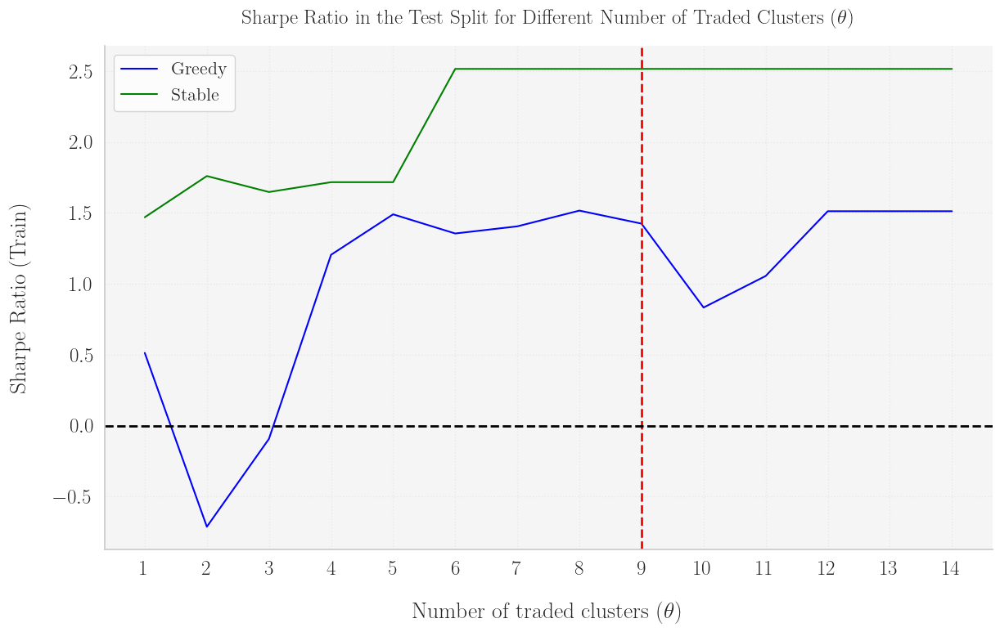

In [ ]:
save_this_plot = True
show_title = True
#===============================================================================================================

# Set the plotting style
sns.set(style="whitegrid")

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

colors = {'Greedy': 'blue', 'Stable': 'green'}

# Initialize the figure
plt.figure(figsize=(14, 8))

# Plot the Sharpe Ratios for each L
for column in SR_df.columns:
    plt.plot(SR_df.index, SR_df[column], label=column, color=colors[column])

# Customize the plot
plt.title(r'Sharpe Ratio in the Test Split for Different Number of Traded Clusters ($\theta$)', fontsize=TITLE_FONTSIZE, pad=TITLE_PAD) if show_title else None
plt.xlabel(r'Number of traded clusters ($\theta$)', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.ylabel(f'Sharpe Ratio ({Split})', fontsize=LABEL_FONTSIZE, labelpad=LABEL_PAD)
plt.xticks(fontsize=TICK_FONTSIZE)
plt.yticks(fontsize=TICK_FONTSIZE)
plt.grid(True, alpha=0.3, linestyle=':')
plt.gca().set_facecolor('#f5f5f5')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.xticks(range(1, len(SR_df)+1, 1))

plt.axvline(x=9, color='red', linestyle='--', linewidth=2)     # plot a vertical line at L=4
plt.axhline(y=0, color='black', linestyle='--', linewidth=2)     # Add a horizontal line at 0

# Add a legend with larger font size
plt.legend(fontsize=LEGEND_FONTSIZE, loc='best')

plt.savefig(os.path.join(path_output, f'{model}_RobustnessCheck_SR_Set_vs_Theta_[{Split}]_[Change_theta].pdf'), bbox_inches='tight') if save_this_plot else None

# Show the plot
plt.show()
